# Autores
### Herber Sebastián Silva Muñoz - 21764
### Erick Stiv Junior Guerra Muñoz - 21781

# Task 1 - Preparación del conjunto de datos
Cargue el conjunto de datos de Iris utilizando bibliotecas como sklearn.datasets. Luego, divida el conjunto de datos en conjuntos de entrenamiento y validación.

In [1]:
import math
import time
import torch
from torch import nn, optim
import torch.nn.functional as F
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
import matplotlib.pyplot as plt
from collections import defaultdict
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [2]:
# Carga del dataset de iris
dataset = load_iris()

# Separación de las variables independientes y dependientes
X = dataset.data
y = dataset.target

# Normalización de los datos
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Split de los datos en entrenamiento, validación y test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=68)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=68)

# Impresión de los tamaños de los conjuntos
print(f"Conjunto de entrenamiento: ", X_train.shape, y_train.shape)
print(f"Conjunto de validación: ", X_val.shape, y_val.shape)
print(f"Conjunto de test: ", X_test.shape, y_test.shape)

Conjunto de entrenamiento:  (90, 4) (90,)
Conjunto de validación:  (30, 4) (30,)
Conjunto de test:  (30, 4) (30,)


# Task 2 - Arquitectura modelo
Cree una red neuronal feedforward simple utilizando nn.Module de PyTorch. Luego, defina capa de entrada, capas ocultas y de salida. Después, elija las funciones de activación y el número de neuronas por capa.

In [3]:
# Verificar si CUDA está disponible
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
class SFFNN(nn.Module):
    def __init__(self, input_size, hidden_layers, output_size, regularization=None, dropout_rate=0.5):
        super(SFFNN, self).__init__()
        
        # Definición de capa de entrada
        Layers = []
        In_Features = input_size
        
        # Definición de capas
        for hidden_size, activation in hidden_layers:
            Layers.append(nn.Linear(In_Features, hidden_size))
            if regularization == 'BatchNorm':
                Layers.append(nn.BatchNorm1d(hidden_size))
            if activation == 'ReLU':
                Layers.append(nn.ReLU())
            elif activation == 'Sigmoid':
                Layers.append(nn.Sigmoid())
            elif activation == 'Tanh':
                Layers.append(nn.Tanh())
            else:
                raise ValueError(f"Función de activación no válida: {activation}")
            if regularization == 'Dropout':
                Layers.append(nn.Dropout(dropout_rate))
            In_Features = hidden_size
            
        # Definición de capa de salida
        Layers.append(nn.Linear(In_Features, output_size))
        Layers.append(nn.Softmax(dim=1))
        
        # Definición de la red
        self.model = nn.Sequential(*Layers)
    
    # Paso feedforward
    def forward(self, x):
        return self.model(x)
    
# Parámetros de la red
input_size = X_train.shape[1]
hidden_layers = [(8, 'ReLU'), (16, 'ReLU'), (8, 'ReLU')]
output_size = len(dataset.target_names)

network = SFFNN(input_size, hidden_layers, output_size)

# Impresión de la red
print(network)

SFFNN(
  (model): Sequential(
    (0): Linear(in_features=4, out_features=8, bias=True)
    (1): ReLU()
    (2): Linear(in_features=8, out_features=16, bias=True)
    (3): ReLU()
    (4): Linear(in_features=16, out_features=8, bias=True)
    (5): ReLU()
    (6): Linear(in_features=8, out_features=3, bias=True)
    (7): Softmax(dim=1)
  )
)


# Task 3 - Funciones de Pérdida
Utilice las diferentes funciones de pérdida comunes como Cross-Entropy Loss y MSE para clasificación. Entrene el modelo con diferentes funciones de pérdida y registre las pérdidas de entrenamiento y test. Debe utilizar al menos 3 diferentes funciones. Es decir, procure que su código sea capaz de parametrizar el uso de diferentes funciones de pérdida.

In [5]:
# Definición de función para entrenar el modelo
def train(model, criterion, optimizer, train_loader, test_loader, num_epochs=10, verbose=True):
    train_losses = []
    test_losses = []
    
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0.0
        for inputs, targets in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            
            if not isinstance(criterion, nn.CrossEntropyLoss):
                targets = F.one_hot(targets, num_classes=outputs.size(1)).float()
            
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
            
        train_loss /= len(train_loader)
        train_losses.append(train_loss)
        
        model.eval()
        test_loss = 0.0
        
        with torch.no_grad():
            for inputs, targets in test_loader:
                outputs = model(inputs)
                
                if not isinstance(criterion, nn.CrossEntropyLoss):
                    targets = F.one_hot(targets, num_classes=outputs.size(1)).float()
                
                loss = criterion(outputs, targets)
                test_loss += loss.item()
                
        test_loss /= len(test_loader)
        test_losses.append(test_loss)
        
        if verbose:
            print(f"Epoch {epoch+1}/{num_epochs} Train Loss: {train_loss:.4f} Test Loss: {test_loss:.4f}")
    
    return train_losses, test_losses

In [6]:
# Mapa de funciones de pérdida
loss_map = {
    'CrossEntropy': nn.CrossEntropyLoss(),
    'MSE': nn.MSELoss(),
    'L1': nn.L1Loss(),
    'Huber': nn.HuberLoss(),
    'SmoothL1': nn.SmoothL1Loss(),
    # 'NLL': nn.NLLLoss(),
    # 'PoissonNLL': nn.PoissonNLLLoss(),
    #'KLDiv': nn.KLDivLoss(),
    # 'BCE': nn.BCELoss(),
    # 'BCEWithLogits': nn.BCEWithLogitsLoss(),
    # 'MarginRanking': nn.MarginRankingLoss(),
    # 'HingeEmbedding': nn.HingeEmbeddingLoss(),
    # 'MultiLabelMargin': nn.MultiLabelMarginLoss(),
    # 'SmoothL1': nn.SmoothL1Loss(),
    'SoftMargin': nn.SoftMarginLoss(),
    # 'MultiLabelSoftMargin': nn.MultiLabelSoftMarginLoss(),
    # 'CosineEmbedding': nn.CosineEmbeddingLoss(),
    # 'MultiMargin': nn.MultiMarginLoss(),
    # 'TripletMargin': nn.TripletMarginLoss(),
    # 'CTC': nn.CTCLoss()
}

In [7]:
# Conversión de los datos a tensores
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.long)

# Creación de tensores de entrenamiento, pruebas y validación
train_tensor = TensorDataset(X_train_tensor, y_train_tensor)
test_tensor = TensorDataset(X_test_tensor, y_test_tensor)
validation_tensor = TensorDataset(X_val_tensor, y_val_tensor)

# Cargadores de datos
train_loader = DataLoader(train_tensor, batch_size=32, shuffle=True)
test_loader = DataLoader(test_tensor, batch_size=32, shuffle=False)

Entrenando modelo con: CrossEntropy
--------------------------------------------------
Entrenando modelo con: MSE
--------------------------------------------------
Entrenando modelo con: L1
--------------------------------------------------
Entrenando modelo con: Huber
--------------------------------------------------
Entrenando modelo con: SmoothL1
--------------------------------------------------
Entrenando modelo con: SoftMargin
--------------------------------------------------


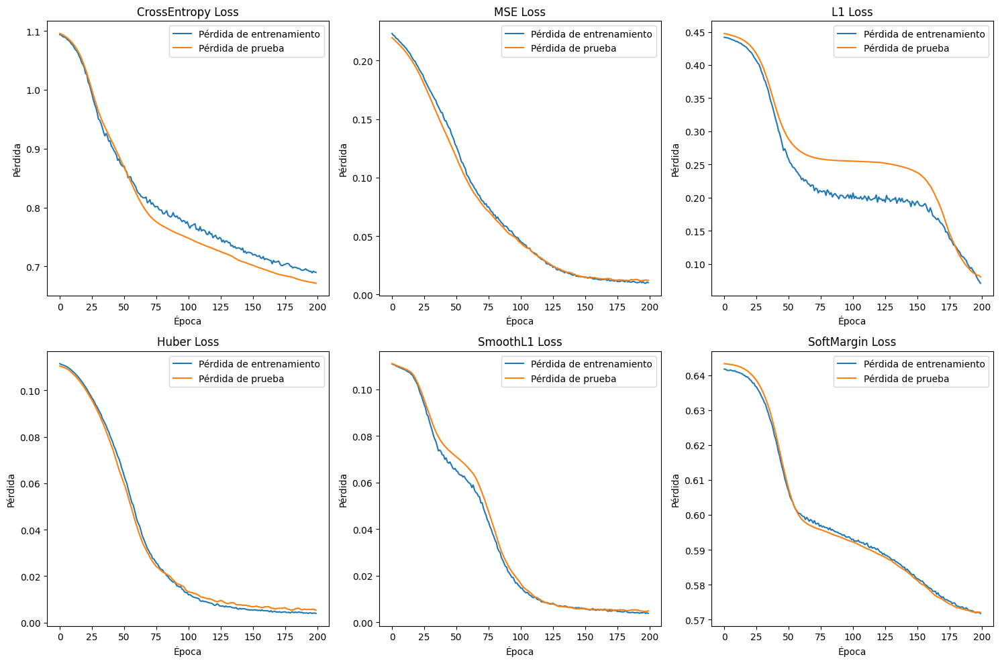

In [8]:
# Configuración de subplots
num_losses = len(loss_map)
num_cols = 3
num_rows = math.ceil(num_losses / num_cols)
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))
axes = axes.flatten()


# Entrenar el modelo con diferentes funciones de pérdida
for idx, (loss_name, loss_fn) in enumerate(loss_map.items()):
    network = SFFNN(input_size, hidden_layers, output_size)
    print(f"Entrenando modelo con: {loss_name}")
    optimizer = optim.Adam(network.parameters(), lr=0.001)
    train_losses, test_losses = train(network, loss_fn, optimizer, train_loader, test_loader, num_epochs=200, verbose=False)
    print('-' * 50)
    
    # Graficar las pérdidas en el subplot correspondiente
    ax = axes[idx]
    ax.plot(train_losses, label='Pérdida de entrenamiento')
    ax.plot(test_losses, label='Pérdida de prueba')
    ax.set_title(f'{loss_name} Loss')
    ax.set_xlabel('Época')
    ax.set_ylabel('Pérdida')
    ax.legend()
    
for i in range(num_losses, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

# Task 4 - Técnicas de regularización
Utilice distintas técnicas de regularización como L1, L2 y dropout. Entrene el modelo con y sin técnicas de regularización y observe el impacto en el overfitting y la generalización. Debe utilizar al menos 3 técnicas diferentes. Es decir, procure que su código sea capaz de parametrizar el uso de diferentes

In [12]:
# Mapa de técnicas de regularización
regularization_options = ['L1', 'L2', 'Dropout', 'BatchNorm']

In [15]:
# Definición de función para entrenar el modelo utilizando técnicas de regularización L1/L2, dropout y batch normalization
def train_reg(model, criterion, optimizer, train_loader, test_loader, num_epochs=10, verbose=True, regularization='L1/L2'):
    train_losses = []
    test_losses = []
    train_accuracies = []
    test_accuracies = []
    train_precisions = []
    test_precisions = []
    train_recalls = []
    test_recalls = []
    train_f1s = []
    test_f1s = []
    
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0.0
        all_preds = []
        all_targets = []
        
        for inputs, targets in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            
            if isinstance(criterion, nn.CrossEntropyLoss):
                loss = criterion(outputs, targets)
                all_targets.extend(targets.cpu().numpy())
            else:
                targets_one_hot = F.one_hot(targets, num_classes=outputs.size(1)).float()
                loss = criterion(outputs, targets_one_hot)
                all_targets.extend(targets.cpu().numpy())
            
            # Aplicar regularización L1/L2
            if regularization == 'L1/L2':
                l1_lambda = 0.001
                l2_lambda = 0.001
                l1_norm = sum(p.abs().sum() for p in model.parameters())
                l2_norm = sum(p.pow(2.0).sum() for p in model.parameters())
                loss += l1_lambda * l1_norm + l2_lambda * l2_norm
            
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
            
            # Guardar predicciones para calcular las métricas
            _, predicted = torch.max(outputs, 1)
            all_preds.extend(predicted.cpu().numpy())
        
        train_loss /= len(train_loader)
        train_losses.append(train_loss)
        
        # Convertir all_targets a etiquetas si es necesario
        if not isinstance(criterion, nn.CrossEntropyLoss):
            all_targets = [target.argmax() if target.ndim > 1 else target for target in all_targets]
        
        train_accuracy = accuracy_score(all_targets, all_preds)
        train_accuracies.append(train_accuracy)
        train_precision = precision_score(all_targets, all_preds, average='weighted', zero_division=1)
        train_precisions.append(train_precision)
        train_recall = recall_score(all_targets, all_preds, average='weighted', zero_division=1)
        train_recalls.append(train_recall)
        train_f1 = f1_score(all_targets, all_preds, average='weighted', zero_division=1)
        train_f1s.append(train_f1)
        
        model.eval()
        test_loss = 0.0
        all_preds = []
        all_targets = []
        
        with torch.no_grad():
            for inputs, targets in test_loader:
                outputs = model(inputs)
                
                if isinstance(criterion, nn.CrossEntropyLoss):
                    loss = criterion(outputs, targets)
                    all_targets.extend(targets.cpu().numpy())
                else:
                    targets_one_hot = F.one_hot(targets, num_classes=outputs.size(1)).float()
                    loss = criterion(outputs, targets_one_hot)
                    all_targets.extend(targets.cpu().numpy())
                
                test_loss += loss.item()
                
                # Guardar predicciones para calcular las métricas
                _, predicted = torch.max(outputs, 1)
                all_preds.extend(predicted.cpu().numpy())
                
        test_loss /= len(test_loader)
        test_losses.append(test_loss)
        
        # Convertir all_targets a etiquetas si es necesario
        if not isinstance(criterion, nn.CrossEntropyLoss):
            all_targets = [target.argmax() if target.ndim > 1 else target for target in all_targets]
        
        test_accuracy = accuracy_score(all_targets, all_preds)
        test_accuracies.append(test_accuracy)
        test_precision = precision_score(all_targets, all_preds, average='weighted', zero_division=1)
        test_precisions.append(test_precision)
        test_recall = recall_score(all_targets, all_preds, average='weighted', zero_division=1)
        test_recalls.append(test_recall)
        test_f1 = f1_score(all_targets, all_preds, average='weighted', zero_division=1)
        test_f1s.append(test_f1)
        
        if verbose:
            print(f"Epoch {epoch+1}/{num_epochs} Train Loss: {train_loss:.4f} Test Loss: {test_loss:.4f} Train Acc: {train_accuracy:.4f} Test Acc: {test_accuracy:.4f}")
            print(f"Train Precision: {train_precision:.4f} Test Precision: {test_precision:.4f} Train Recall: {train_recall:.4f} Test Recall: {test_recall:.4f} Train F1: {train_f1:.4f} Test F1: {test_f1:.4f}")
    
    return train_losses, test_losses, train_accuracies, test_accuracies, train_precisions, test_precisions, train_recalls, test_recalls, train_f1s, test_f1s

Entrenando modelo con: CrossEntropy y regularización: L1
Entrenando modelo con: CrossEntropy y regularización: L2
Entrenando modelo con: CrossEntropy y regularización: Dropout
Entrenando modelo con: CrossEntropy y regularización: BatchNorm
Entrenando modelo con: MSE y regularización: L1
Entrenando modelo con: MSE y regularización: L2
Entrenando modelo con: MSE y regularización: Dropout
Entrenando modelo con: MSE y regularización: BatchNorm
Entrenando modelo con: L1 y regularización: L1
Entrenando modelo con: L1 y regularización: L2
Entrenando modelo con: L1 y regularización: Dropout
Entrenando modelo con: L1 y regularización: BatchNorm
Entrenando modelo con: Huber y regularización: L1
Entrenando modelo con: Huber y regularización: L2
Entrenando modelo con: Huber y regularización: Dropout
Entrenando modelo con: Huber y regularización: BatchNorm
Entrenando modelo con: SmoothL1 y regularización: L1
Entrenando modelo con: SmoothL1 y regularización: L2
Entrenando modelo con: SmoothL1 y regu

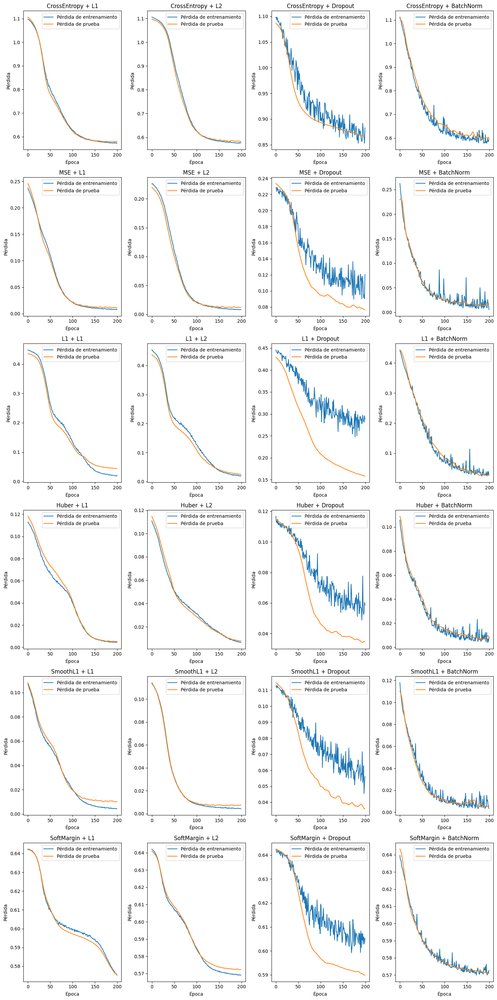

In [16]:
# Configuración de subplots
num_losses = len(loss_map)
num_regularizations = len(regularization_options)
num_combinations = num_losses * num_regularizations
num_cols = num_regularizations
num_rows = math.ceil(num_combinations / num_cols)
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))
axes = axes.flatten()

# Entrenar el modelo con diferentes funciones de pérdida y técnicas de regularización
for i, (loss_name, loss_fn) in enumerate(loss_map.items()):
    for j, reg in enumerate(regularization_options):
        idx = i * len(regularization_options) + j
        if idx >= len(axes):
            print(f"Índice {idx} fuera de los límites de los subplots, saltando esta combinación.")
            continue
        network = SFFNN(input_size, hidden_layers, output_size, regularization=reg)
        print(f"Entrenando modelo con: {loss_name} y regularización: {reg}")
        optimizer = optim.Adam(network.parameters(), lr=0.001)
        train_losses, test_losses, _, _, _, _, _, _, _, _ = train_reg(network, loss_fn, optimizer, train_loader, test_loader, num_epochs=200, verbose=False, regularization=reg)
        
        # Graficar las pérdidas
        ax = axes[idx]
        ax.plot(train_losses, label='Pérdida de entrenamiento')
        ax.plot(test_losses, label='Pérdida de prueba')
        ax.set_title(f'{loss_name} + {reg}')
        ax.set_xlabel('Época')
        ax.set_ylabel('Pérdida')
        ax.legend()

# Eliminar subplots vacíos si hay menos combinaciones que subplots
for i in range(num_combinations, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

# Task 5 - Algoritmos de Optimización
Utilice distintas técnicas de optimización como SGD, Batch GD, Mini-Batch GD. Entrene el modelo con algoritmos de optimización y registre las pérdidas y tiempos de entrenamiento y test. Debe utilizar al menos 3 diferentes algoritmos. Es decir, procure que su código sea capaz de parametrizar el uso de diferentes algoritmos de optimización.

In [17]:
# Mapa de técnicas de regularización
regularization_options = ['L1', 'L2', 'Dropout', 'BatchNorm', 'No Regularization']

In [18]:
# Mapa de algoritmos de optimización
optimization_algos = {
    'BatchGD': optim.SGD,
    'MiniBatchGD': optim.SGD,
    'Adam': optim.Adam,
}

Optimizador: BatchGD
Entrenando modelo con: CrossEntropy, regularización: L1, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.26 segundos


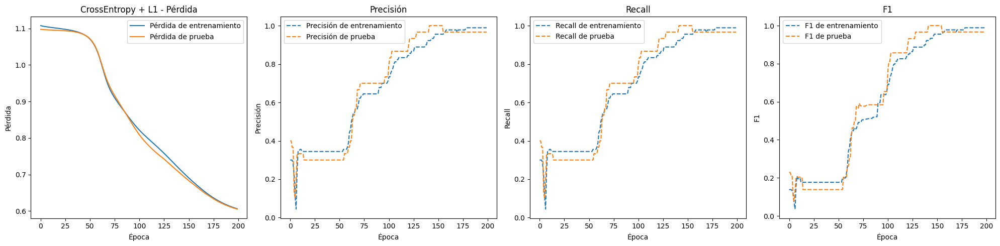

Entrenando modelo con: CrossEntropy, regularización: L2, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.26 segundos


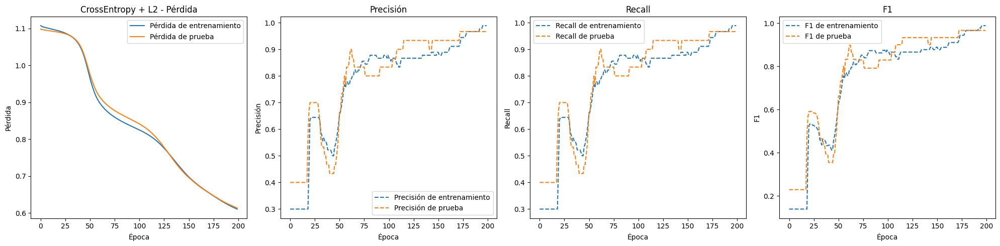

Entrenando modelo con: CrossEntropy, regularización: Dropout, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.46 segundos


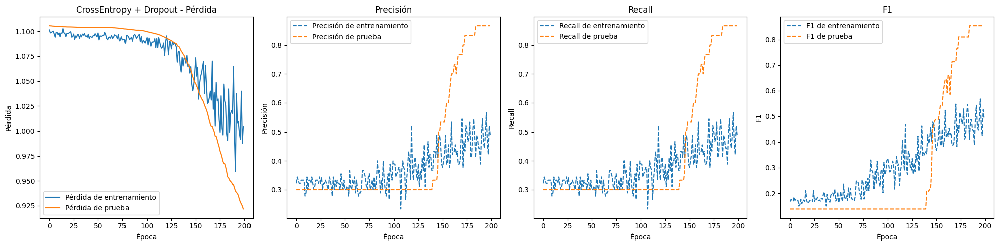

Entrenando modelo con: CrossEntropy, regularización: BatchNorm, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.31 segundos


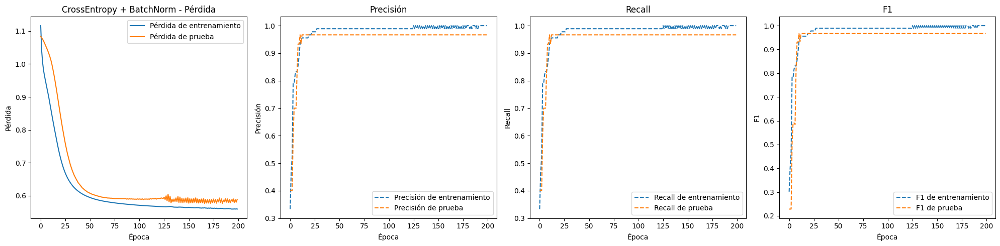

Entrenando modelo con: CrossEntropy, regularización: No Regularization, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.70 segundos


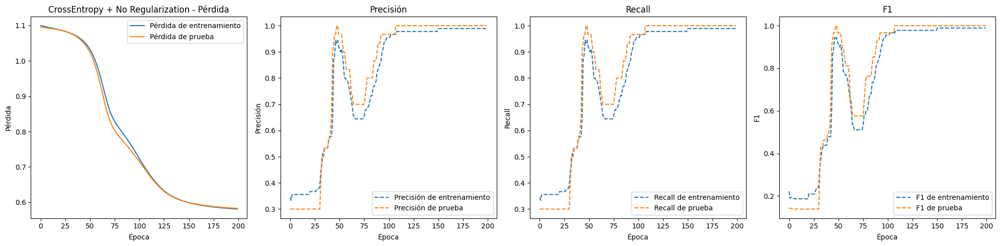

Entrenando modelo con: MSE, regularización: L1, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.45 segundos


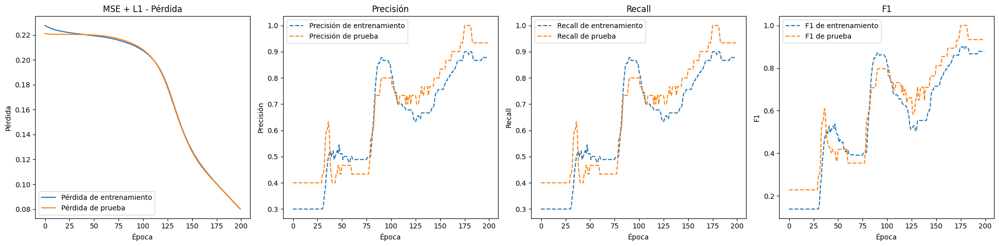

Entrenando modelo con: MSE, regularización: L2, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.30 segundos


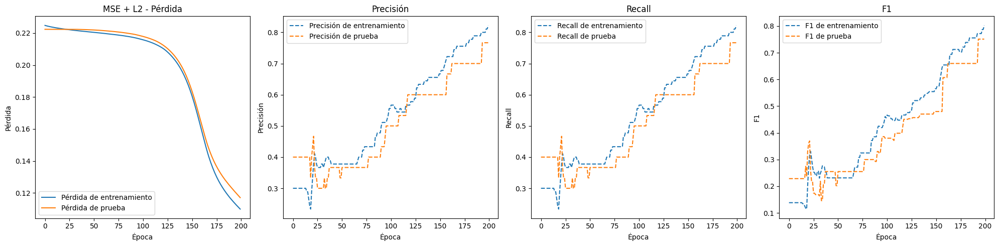

Entrenando modelo con: MSE, regularización: Dropout, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.36 segundos


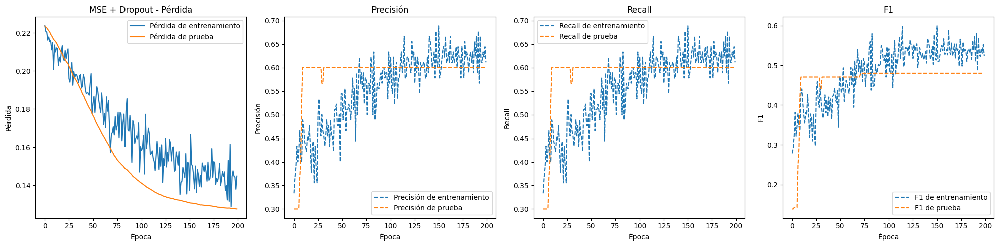

Entrenando modelo con: MSE, regularización: BatchNorm, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.48 segundos


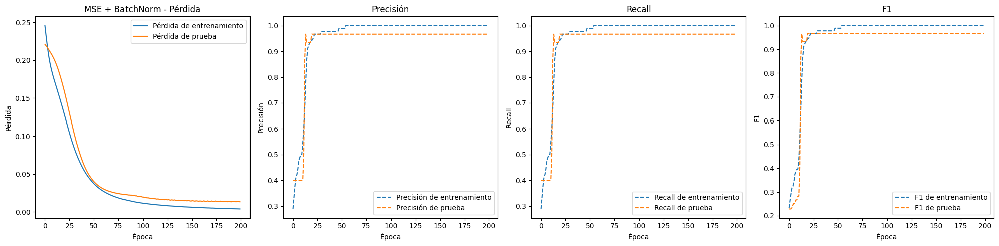

Entrenando modelo con: MSE, regularización: No Regularization, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.38 segundos


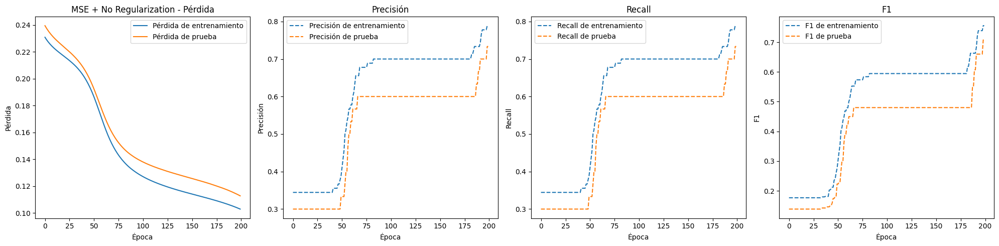

Entrenando modelo con: L1, regularización: L1, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.34 segundos


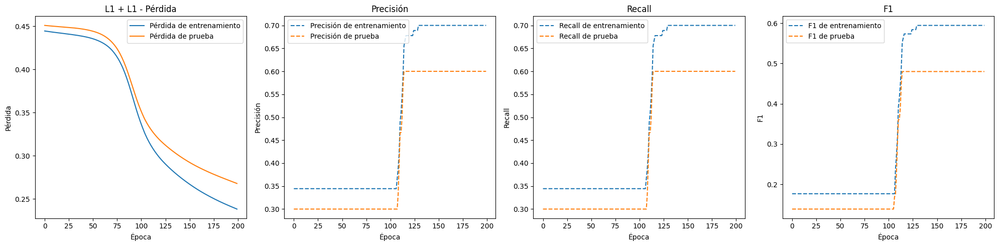

Entrenando modelo con: L1, regularización: L2, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 2.82 segundos


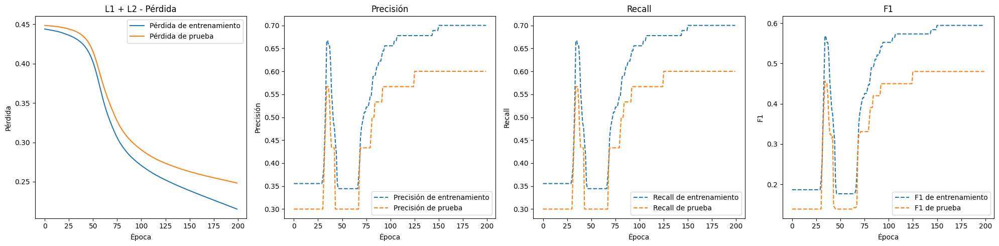

Entrenando modelo con: L1, regularización: Dropout, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.27 segundos


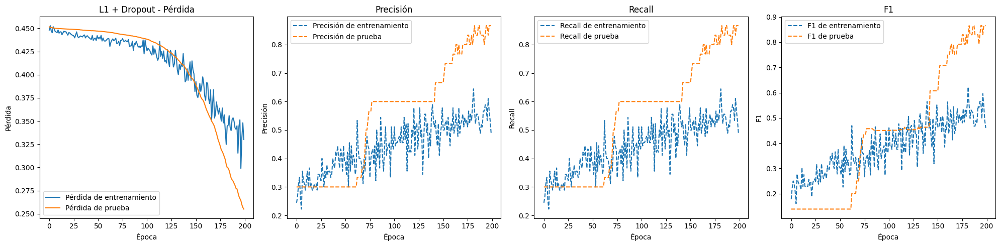

Entrenando modelo con: L1, regularización: BatchNorm, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.50 segundos


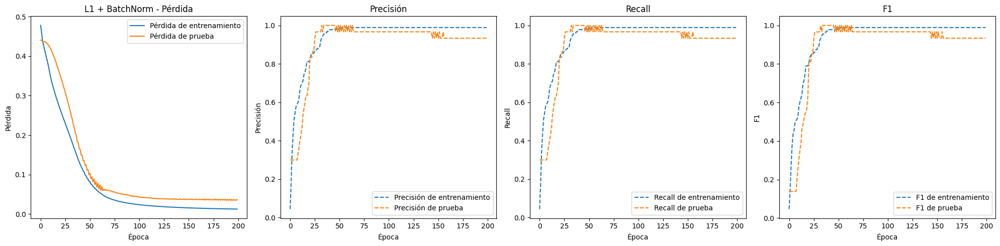

Entrenando modelo con: L1, regularización: No Regularization, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.29 segundos


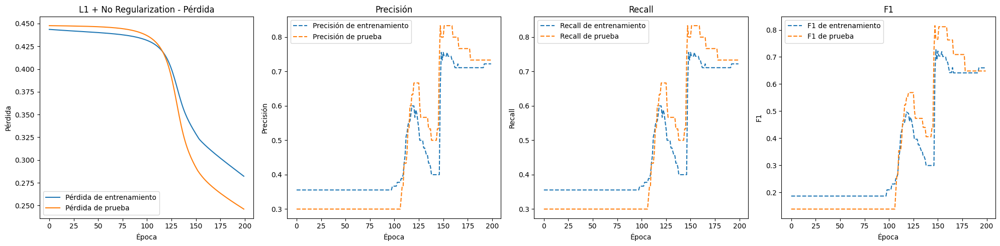

Entrenando modelo con: Huber, regularización: L1, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.30 segundos


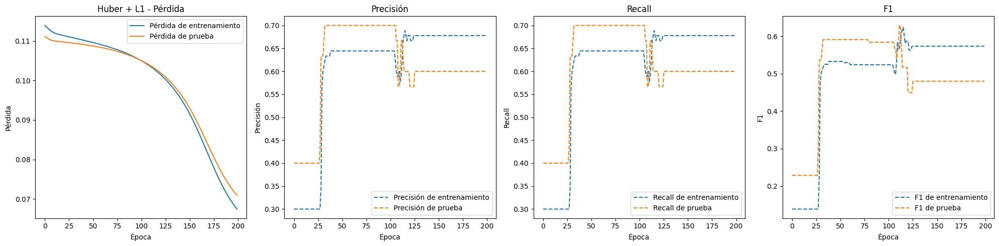

Entrenando modelo con: Huber, regularización: L2, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.54 segundos


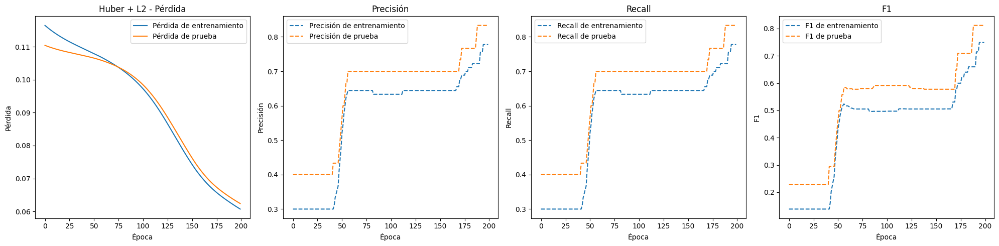

Entrenando modelo con: Huber, regularización: Dropout, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.54 segundos


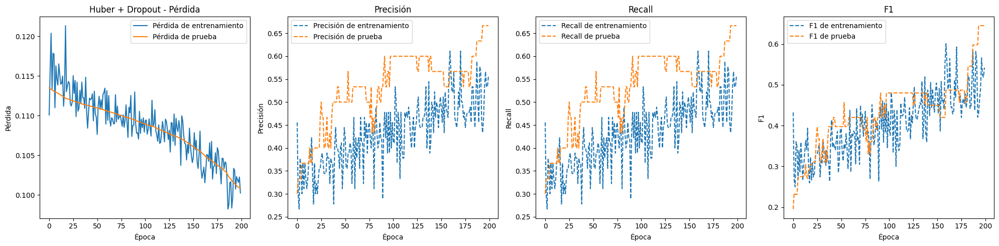

Entrenando modelo con: Huber, regularización: BatchNorm, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.48 segundos


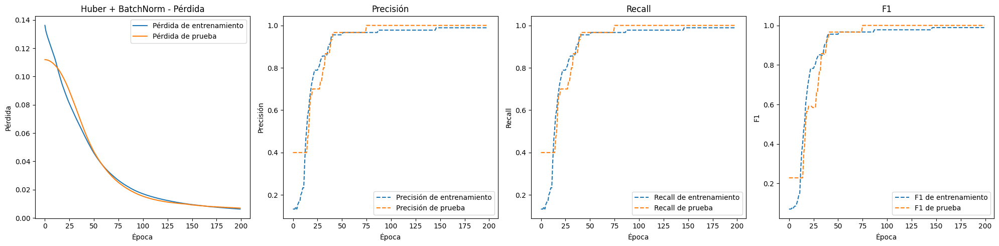

Entrenando modelo con: Huber, regularización: No Regularization, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.23 segundos


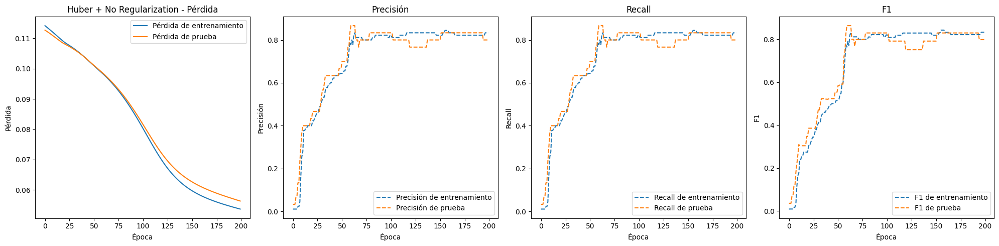

Entrenando modelo con: SmoothL1, regularización: L1, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.36 segundos


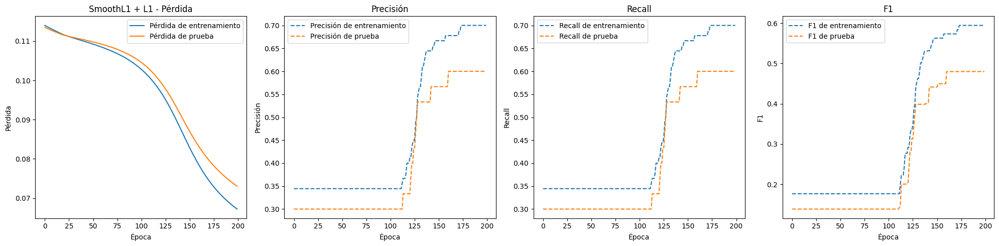

Entrenando modelo con: SmoothL1, regularización: L2, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.35 segundos


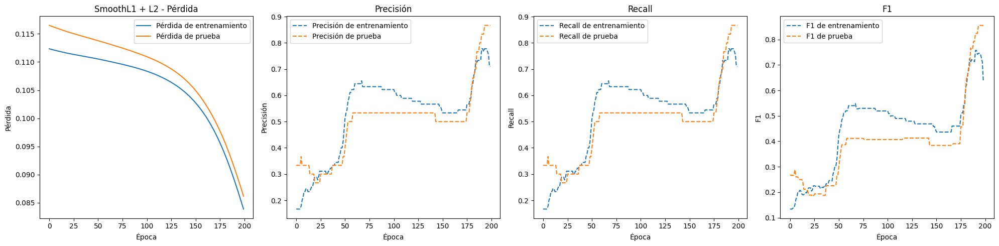

Entrenando modelo con: SmoothL1, regularización: Dropout, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.56 segundos


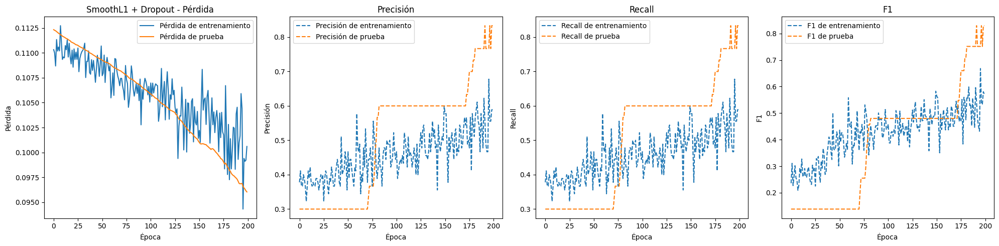

Entrenando modelo con: SmoothL1, regularización: BatchNorm, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.72 segundos


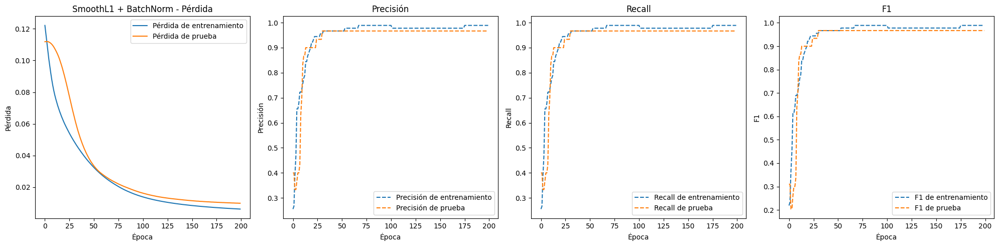

Entrenando modelo con: SmoothL1, regularización: No Regularization, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.98 segundos


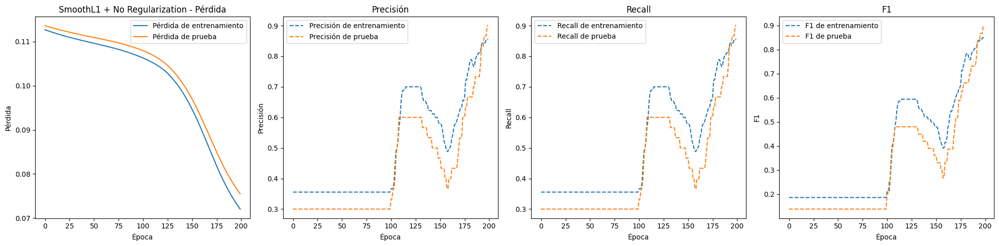

Entrenando modelo con: SoftMargin, regularización: L1, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 4.43 segundos


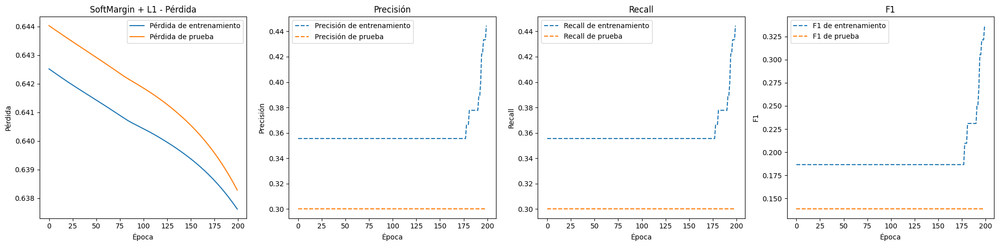

Entrenando modelo con: SoftMargin, regularización: L2, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.46 segundos


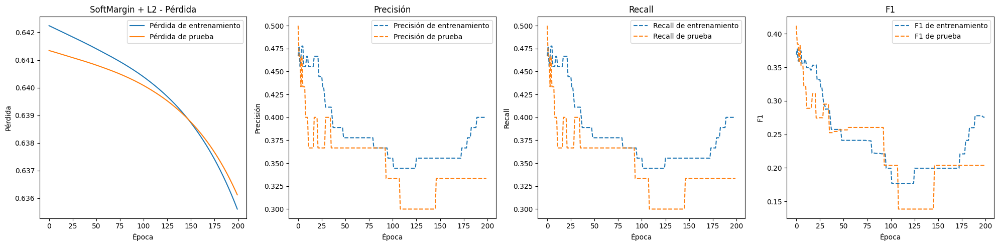

Entrenando modelo con: SoftMargin, regularización: Dropout, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.51 segundos


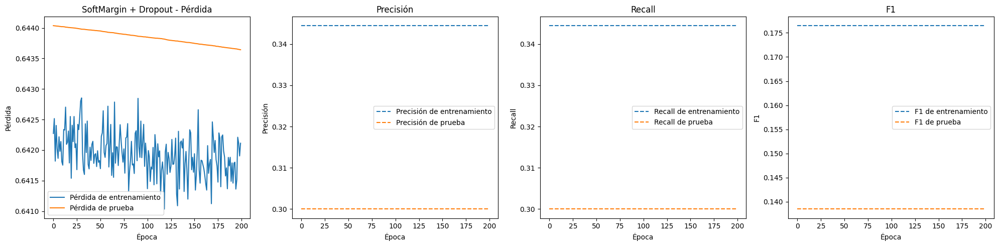

Entrenando modelo con: SoftMargin, regularización: BatchNorm, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.64 segundos


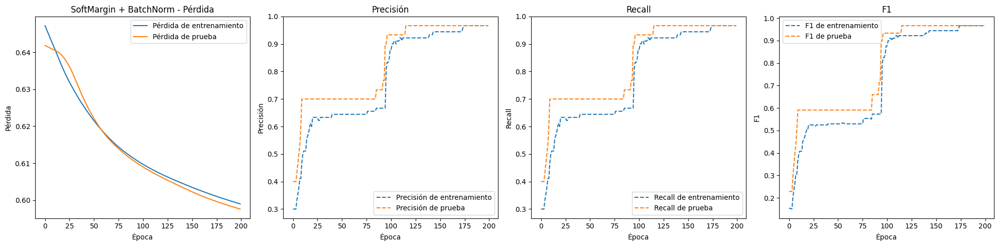

Entrenando modelo con: SoftMargin, regularización: No Regularization, optimizador: BatchGD
Tiempo de entrenamiento y prueba: 3.35 segundos


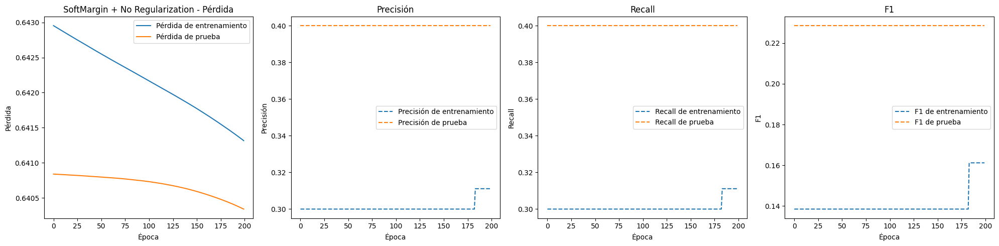

Optimizador: MiniBatchGD
Entrenando modelo con: CrossEntropy, regularización: L1, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 3.88 segundos


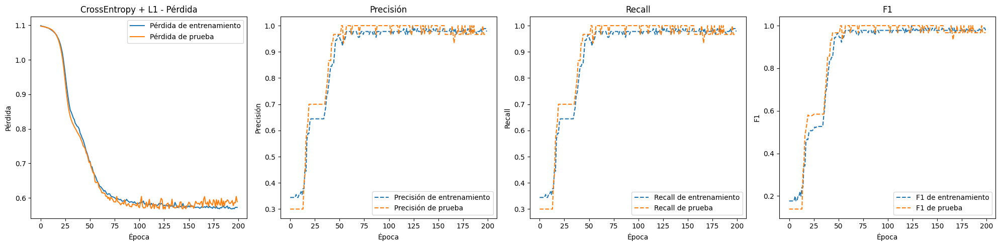

Entrenando modelo con: CrossEntropy, regularización: L2, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 3.86 segundos


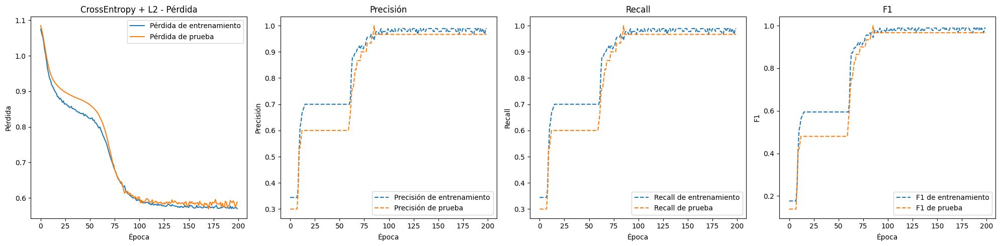

Entrenando modelo con: CrossEntropy, regularización: Dropout, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 4.08 segundos


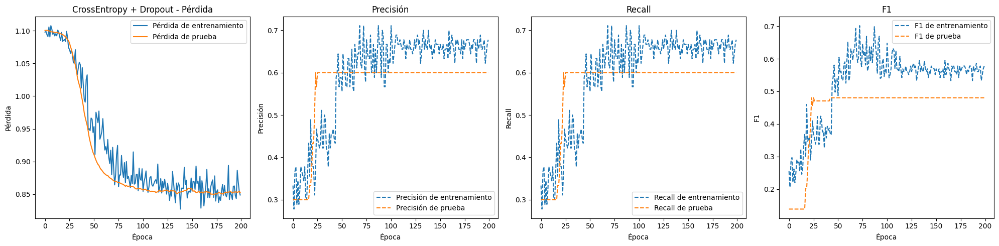

Entrenando modelo con: CrossEntropy, regularización: BatchNorm, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 3.93 segundos


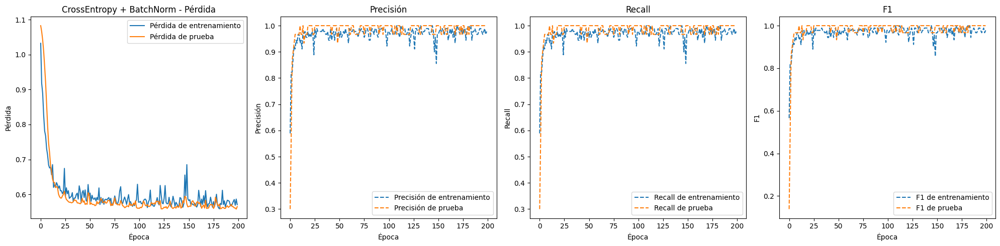

Entrenando modelo con: CrossEntropy, regularización: No Regularization, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 4.18 segundos


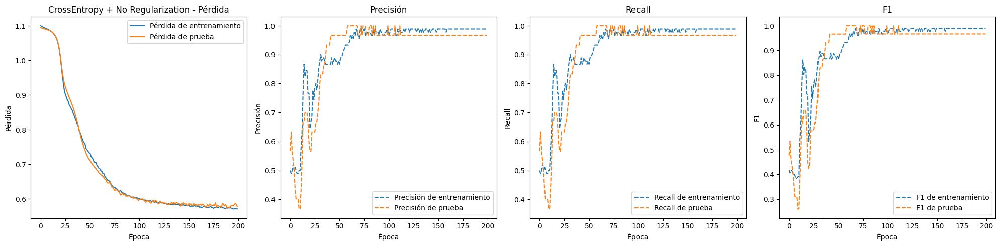

Entrenando modelo con: MSE, regularización: L1, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 4.25 segundos


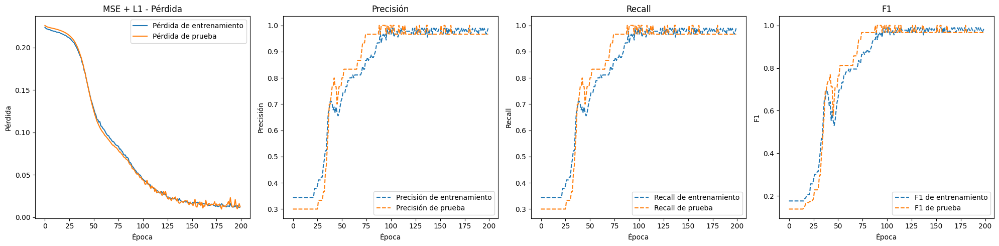

Entrenando modelo con: MSE, regularización: L2, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 4.19 segundos


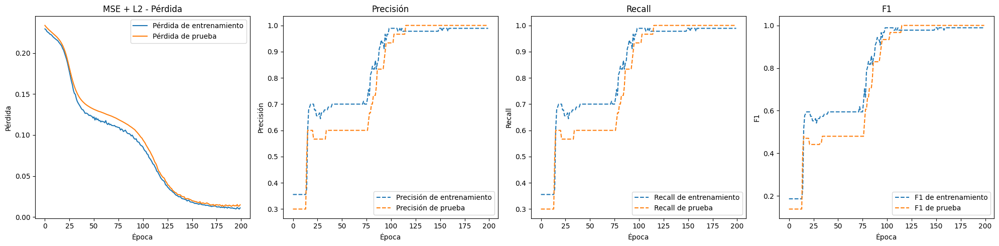

Entrenando modelo con: MSE, regularización: Dropout, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 4.58 segundos


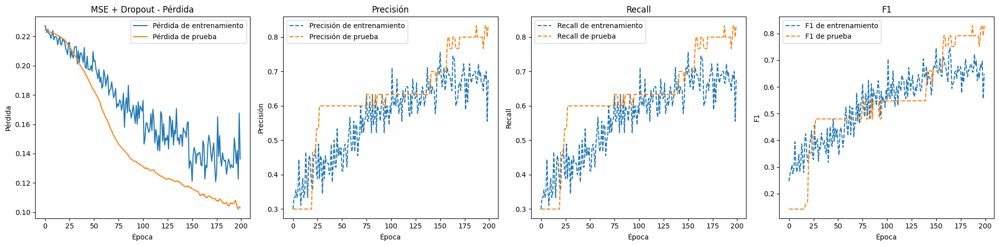

Entrenando modelo con: MSE, regularización: BatchNorm, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 4.57 segundos


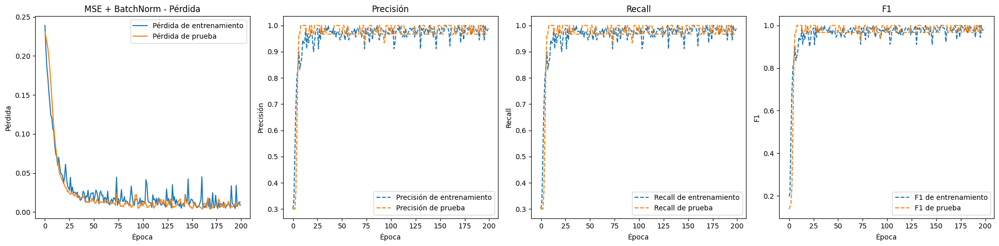

Entrenando modelo con: MSE, regularización: No Regularization, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 4.07 segundos


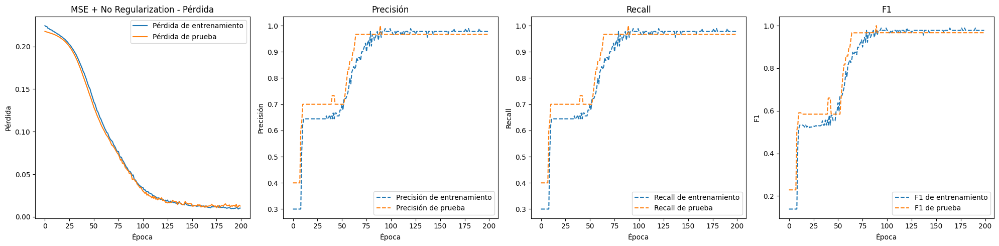

Entrenando modelo con: L1, regularización: L1, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 3.54 segundos


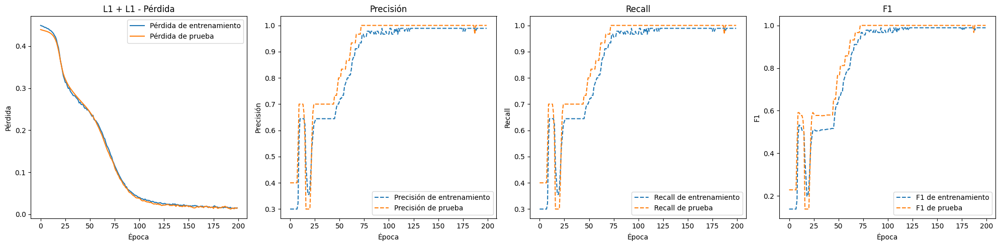

Entrenando modelo con: L1, regularización: L2, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 4.16 segundos


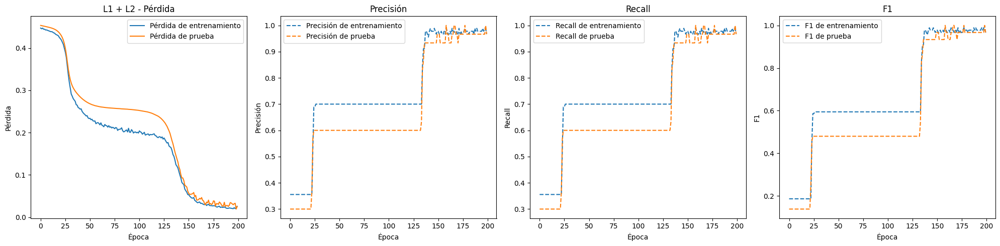

Entrenando modelo con: L1, regularización: Dropout, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 4.39 segundos


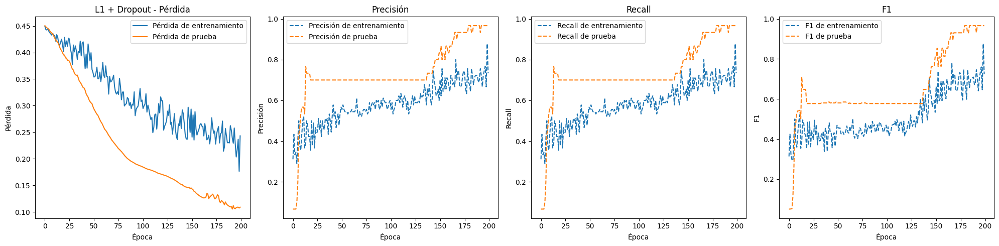

Entrenando modelo con: L1, regularización: BatchNorm, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 4.53 segundos


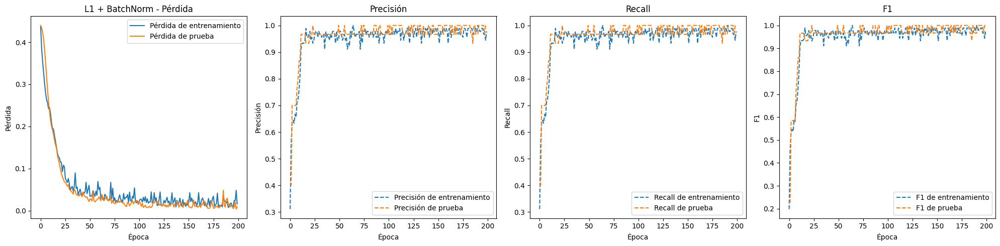

Entrenando modelo con: L1, regularización: No Regularization, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 4.13 segundos


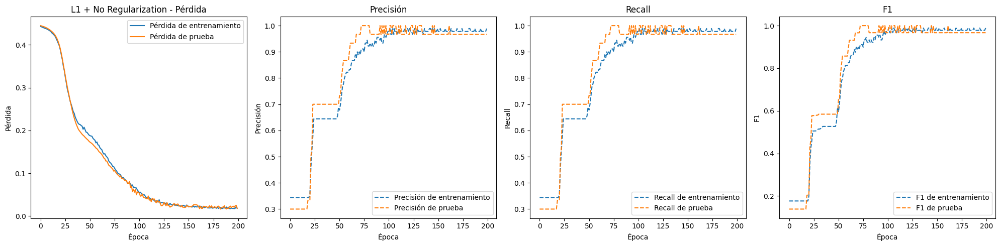

Entrenando modelo con: Huber, regularización: L1, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 4.15 segundos


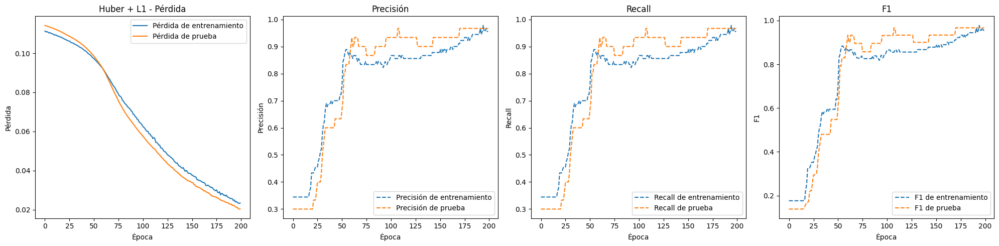

Entrenando modelo con: Huber, regularización: L2, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 3.48 segundos


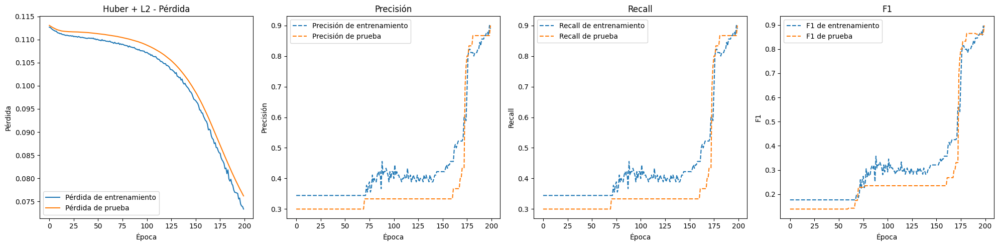

Entrenando modelo con: Huber, regularización: Dropout, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 4.19 segundos


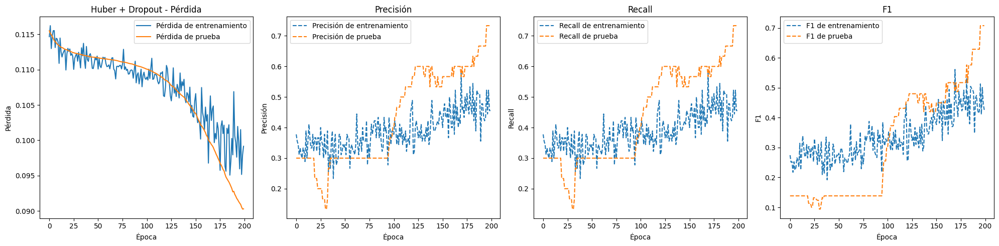

Entrenando modelo con: Huber, regularización: BatchNorm, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 4.46 segundos


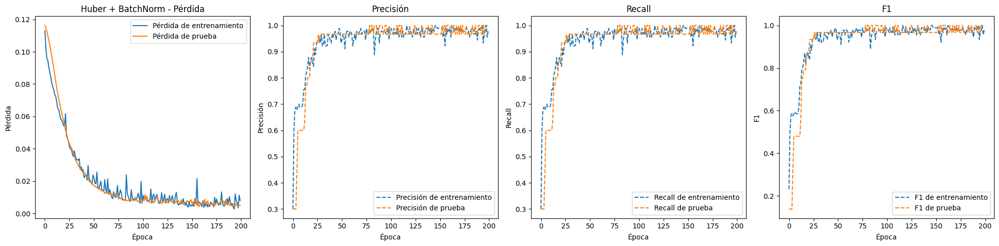

Entrenando modelo con: Huber, regularización: No Regularization, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 5.48 segundos


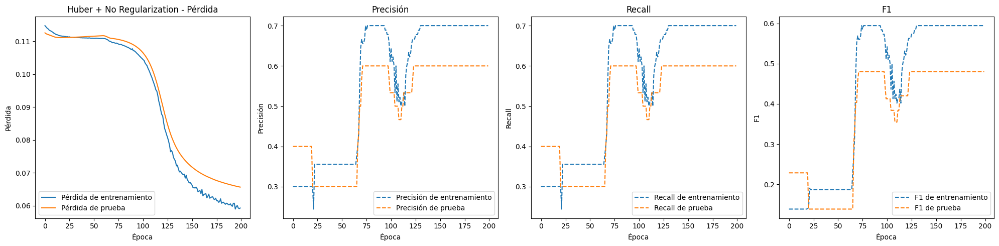

Entrenando modelo con: SmoothL1, regularización: L1, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 4.92 segundos


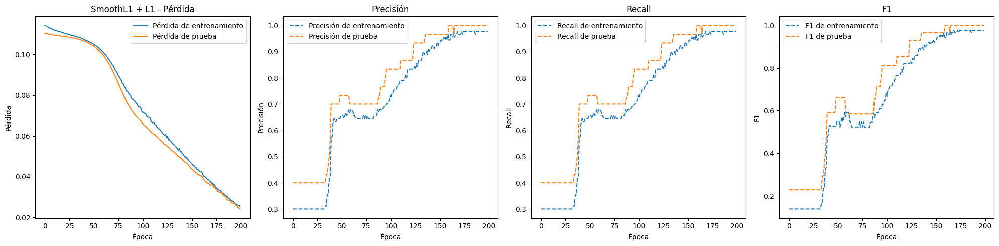

Entrenando modelo con: SmoothL1, regularización: L2, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 4.74 segundos


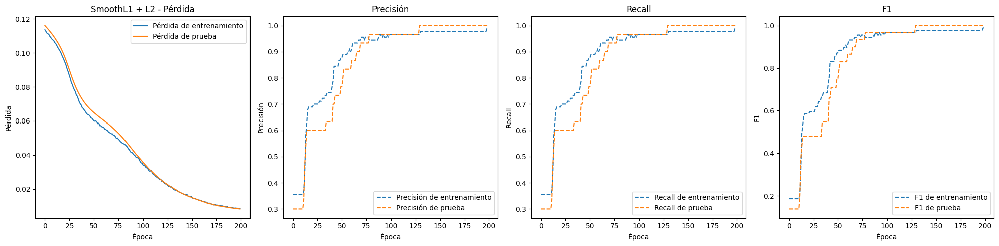

Entrenando modelo con: SmoothL1, regularización: Dropout, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 3.90 segundos


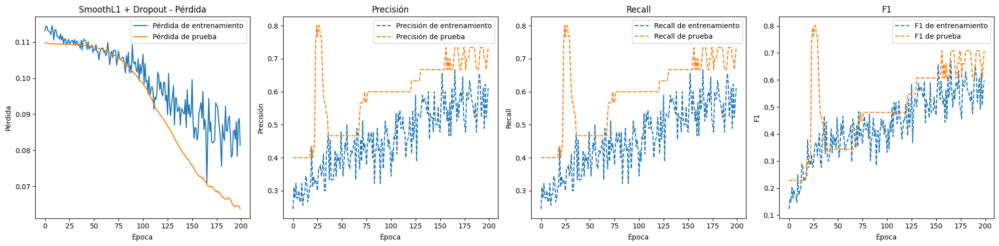

Entrenando modelo con: SmoothL1, regularización: BatchNorm, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 4.48 segundos


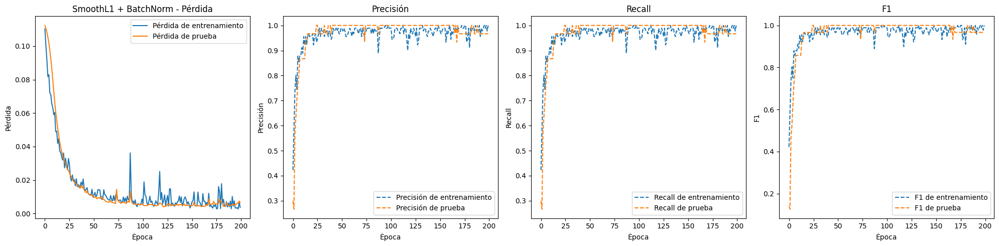

Entrenando modelo con: SmoothL1, regularización: No Regularization, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 4.41 segundos


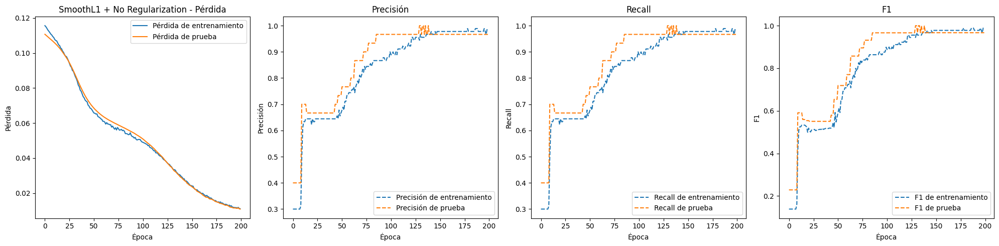

Entrenando modelo con: SoftMargin, regularización: L1, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 4.22 segundos


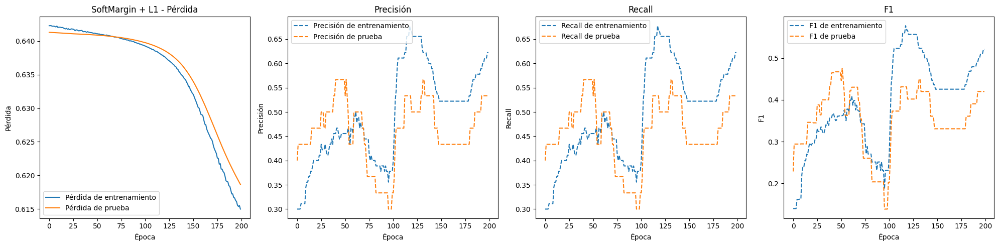

Entrenando modelo con: SoftMargin, regularización: L2, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 4.40 segundos


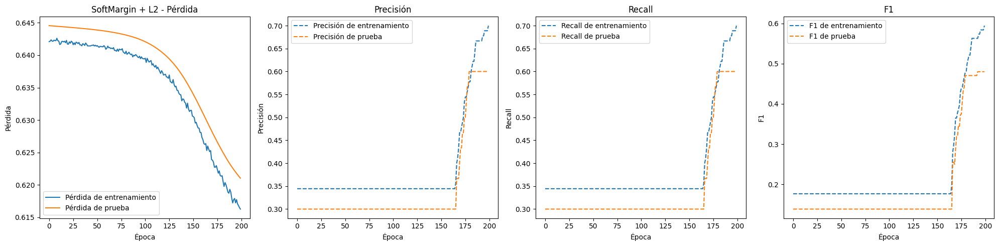

Entrenando modelo con: SoftMargin, regularización: Dropout, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 4.50 segundos


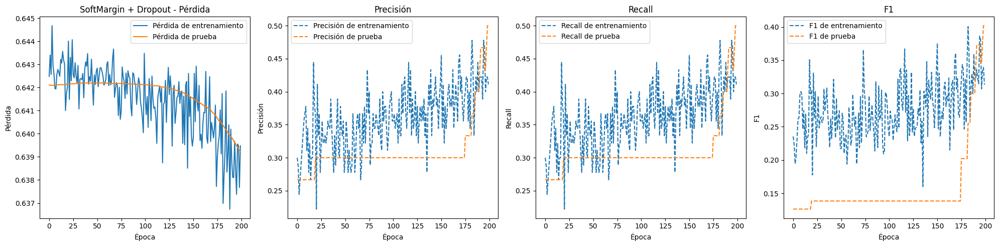

Entrenando modelo con: SoftMargin, regularización: BatchNorm, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 4.52 segundos


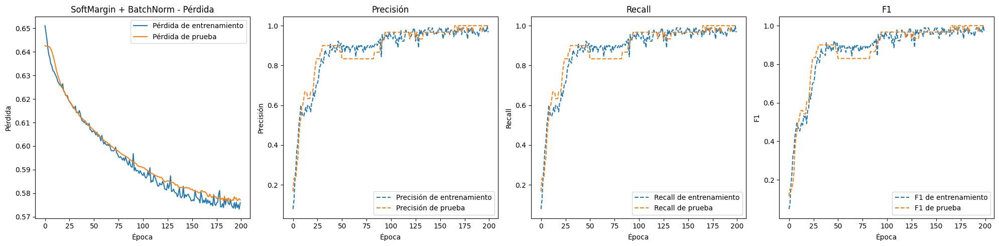

Entrenando modelo con: SoftMargin, regularización: No Regularization, optimizador: MiniBatchGD
Tiempo de entrenamiento y prueba: 4.28 segundos


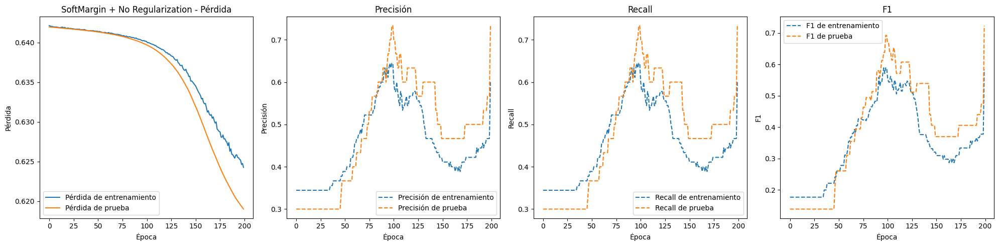

Optimizador: Adam
Entrenando modelo con: CrossEntropy, regularización: L1, optimizador: Adam
Tiempo de entrenamiento y prueba: 4.94 segundos


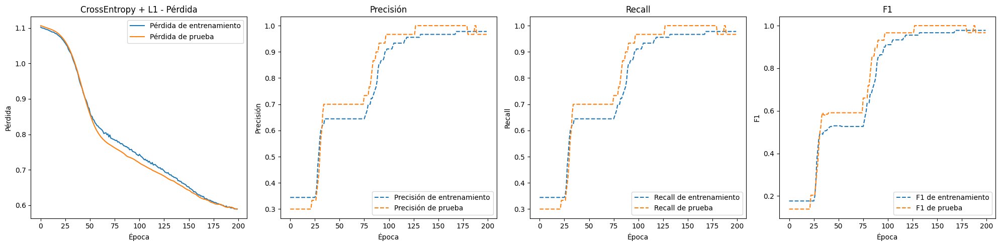

Entrenando modelo con: CrossEntropy, regularización: L2, optimizador: Adam
Tiempo de entrenamiento y prueba: 4.69 segundos


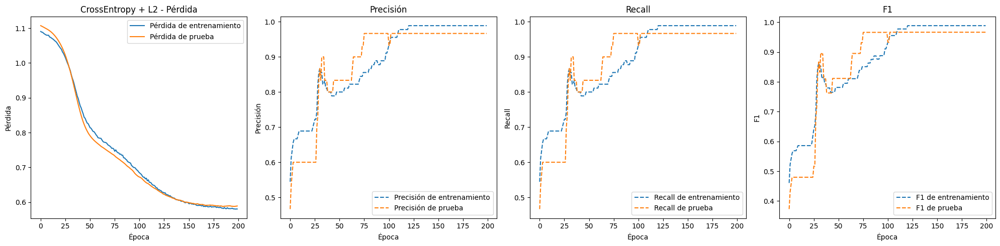

Entrenando modelo con: CrossEntropy, regularización: Dropout, optimizador: Adam
Tiempo de entrenamiento y prueba: 4.67 segundos


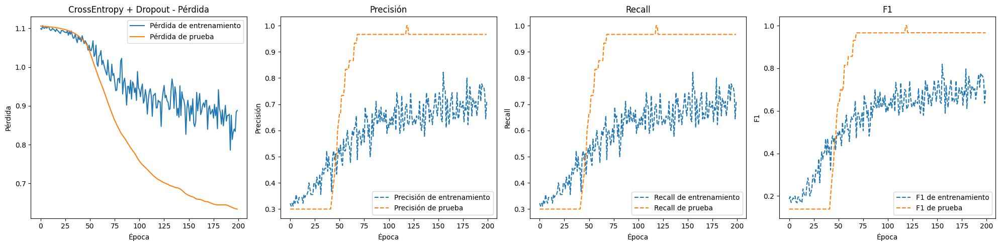

Entrenando modelo con: CrossEntropy, regularización: BatchNorm, optimizador: Adam
Tiempo de entrenamiento y prueba: 5.11 segundos


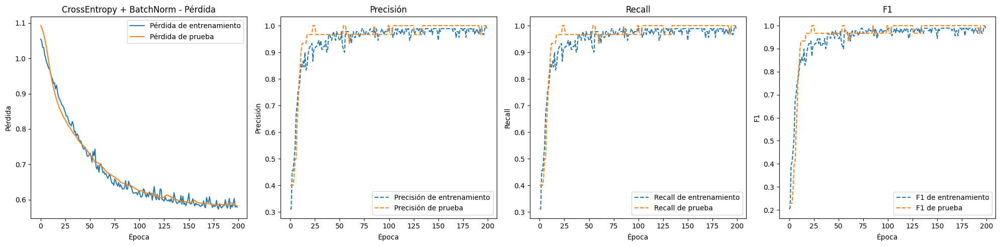

Entrenando modelo con: CrossEntropy, regularización: No Regularization, optimizador: Adam
Tiempo de entrenamiento y prueba: 4.18 segundos


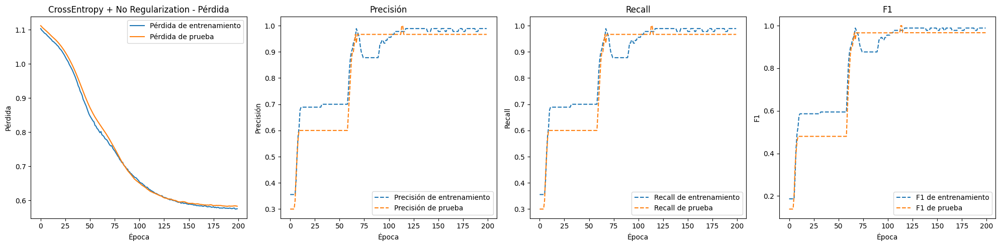

Entrenando modelo con: MSE, regularización: L1, optimizador: Adam
Tiempo de entrenamiento y prueba: 4.43 segundos


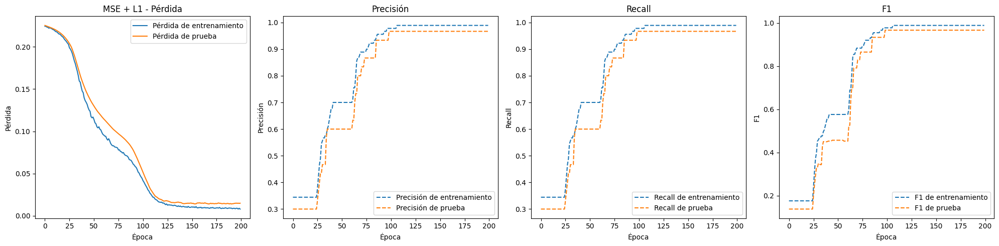

Entrenando modelo con: MSE, regularización: L2, optimizador: Adam
Tiempo de entrenamiento y prueba: 5.11 segundos


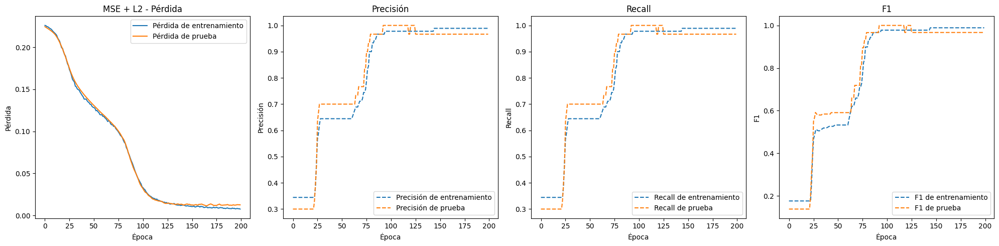

Entrenando modelo con: MSE, regularización: Dropout, optimizador: Adam
Tiempo de entrenamiento y prueba: 5.38 segundos


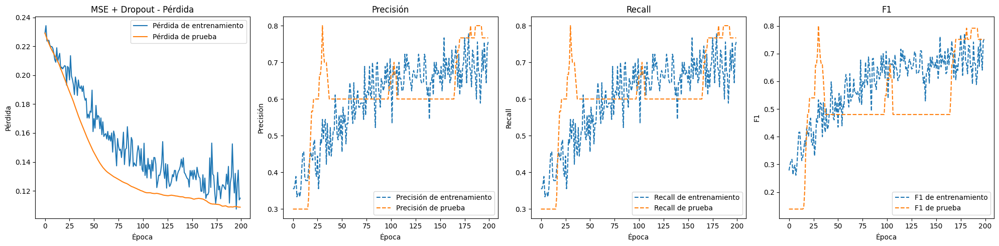

Entrenando modelo con: MSE, regularización: BatchNorm, optimizador: Adam
Tiempo de entrenamiento y prueba: 5.51 segundos


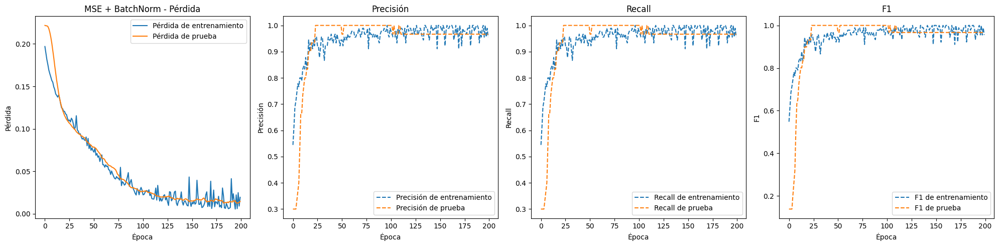

Entrenando modelo con: MSE, regularización: No Regularization, optimizador: Adam
Tiempo de entrenamiento y prueba: 5.21 segundos


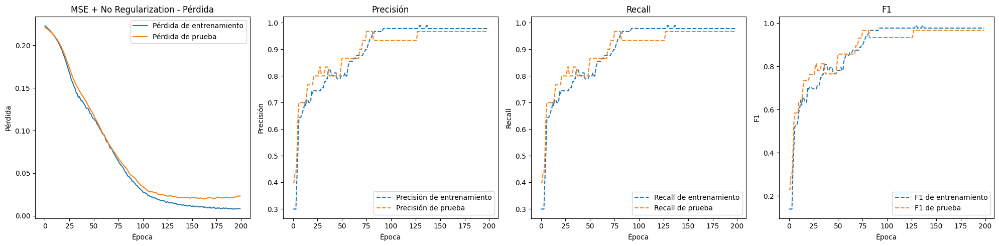

Entrenando modelo con: L1, regularización: L1, optimizador: Adam
Tiempo de entrenamiento y prueba: 4.57 segundos


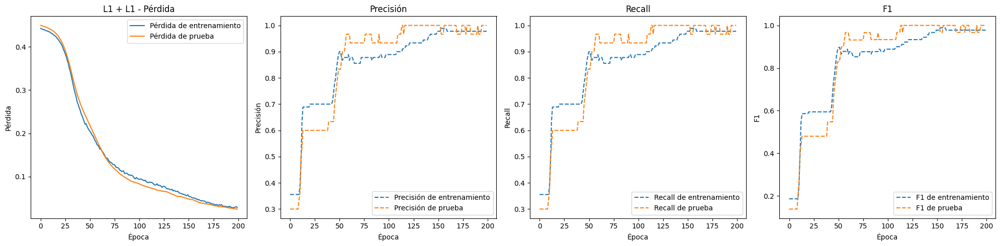

Entrenando modelo con: L1, regularización: L2, optimizador: Adam
Tiempo de entrenamiento y prueba: 4.61 segundos


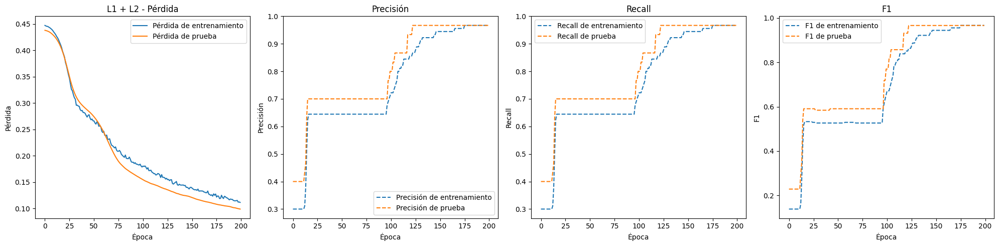

Entrenando modelo con: L1, regularización: Dropout, optimizador: Adam
Tiempo de entrenamiento y prueba: 5.32 segundos


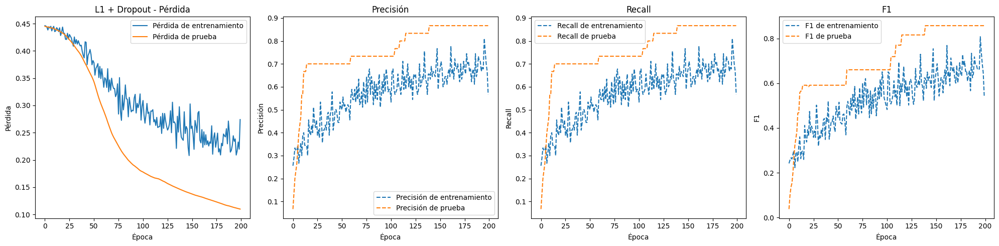

Entrenando modelo con: L1, regularización: BatchNorm, optimizador: Adam
Tiempo de entrenamiento y prueba: 5.18 segundos


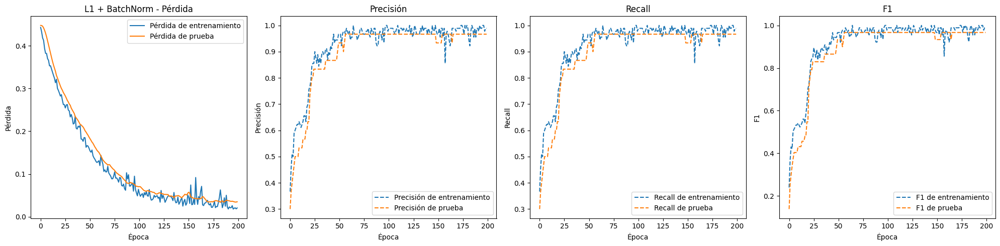

Entrenando modelo con: L1, regularización: No Regularization, optimizador: Adam
Tiempo de entrenamiento y prueba: 5.04 segundos


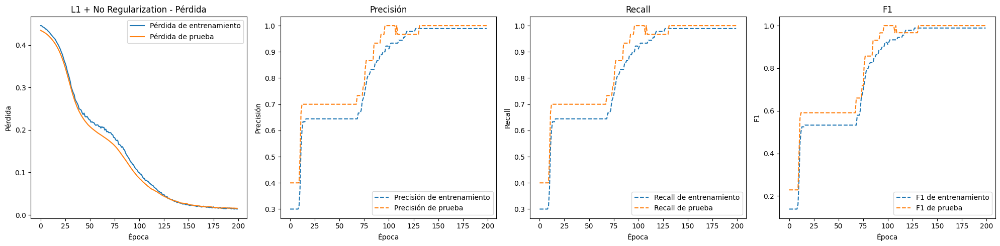

Entrenando modelo con: Huber, regularización: L1, optimizador: Adam
Tiempo de entrenamiento y prueba: 4.91 segundos


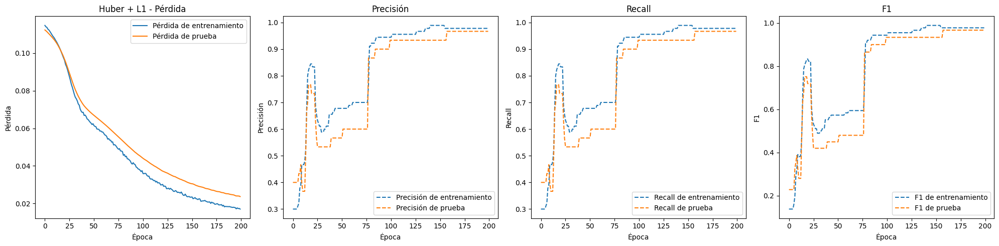

Entrenando modelo con: Huber, regularización: L2, optimizador: Adam
Tiempo de entrenamiento y prueba: 4.58 segundos


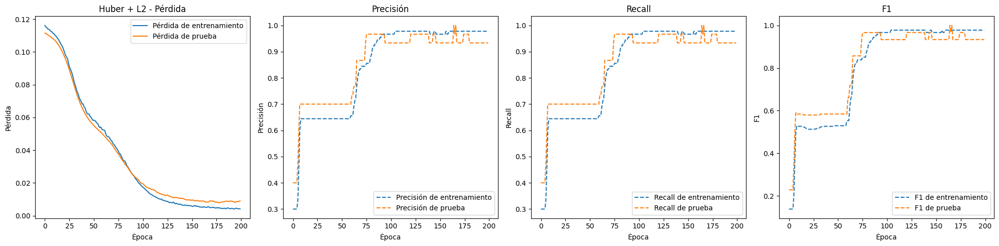

Entrenando modelo con: Huber, regularización: Dropout, optimizador: Adam
Tiempo de entrenamiento y prueba: 4.76 segundos


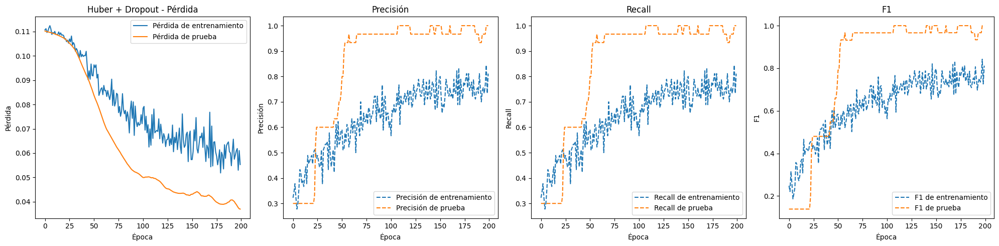

Entrenando modelo con: Huber, regularización: BatchNorm, optimizador: Adam
Tiempo de entrenamiento y prueba: 5.38 segundos


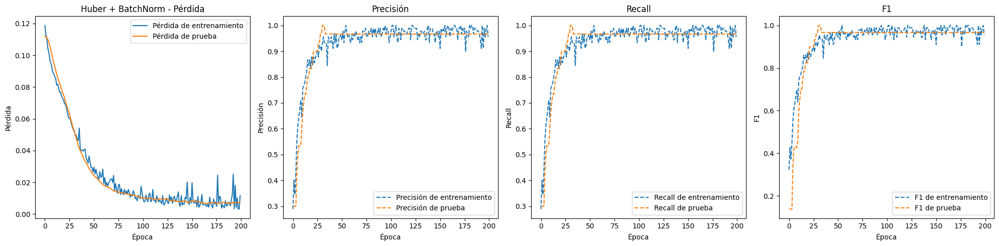

Entrenando modelo con: Huber, regularización: No Regularization, optimizador: Adam
Tiempo de entrenamiento y prueba: 4.50 segundos


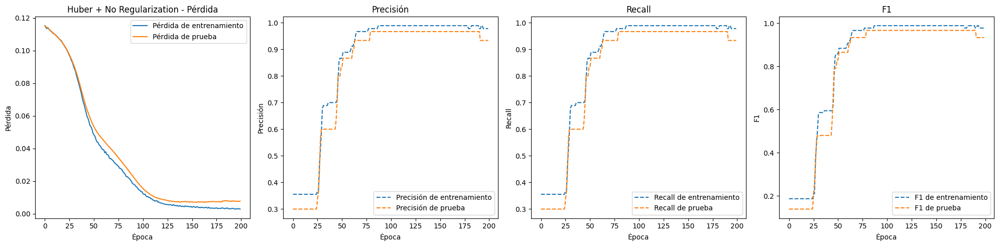

Entrenando modelo con: SmoothL1, regularización: L1, optimizador: Adam
Tiempo de entrenamiento y prueba: 4.51 segundos


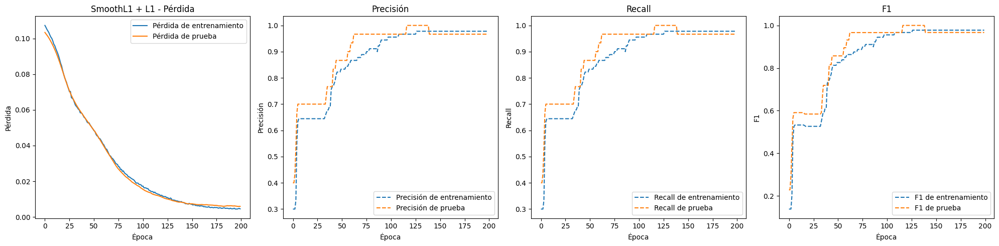

Entrenando modelo con: SmoothL1, regularización: L2, optimizador: Adam
Tiempo de entrenamiento y prueba: 4.64 segundos


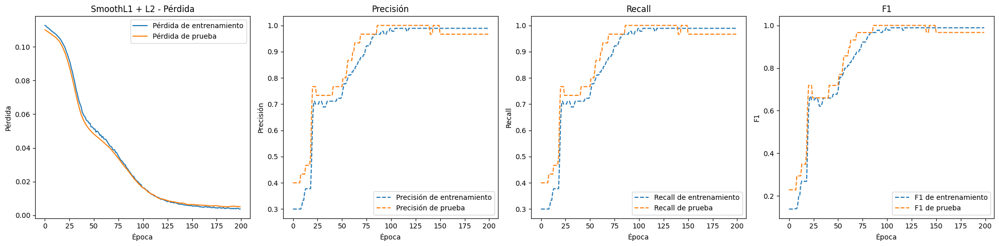

Entrenando modelo con: SmoothL1, regularización: Dropout, optimizador: Adam
Tiempo de entrenamiento y prueba: 4.80 segundos


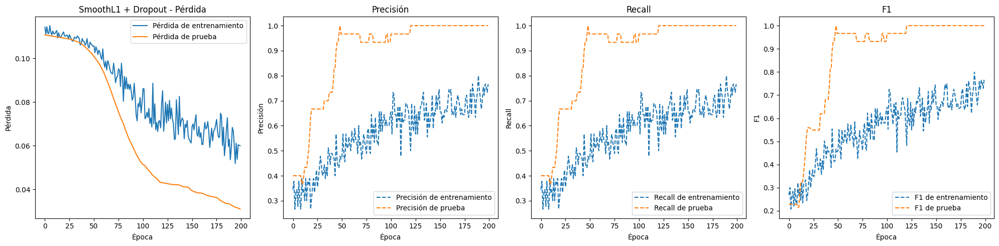

Entrenando modelo con: SmoothL1, regularización: BatchNorm, optimizador: Adam
Tiempo de entrenamiento y prueba: 5.12 segundos


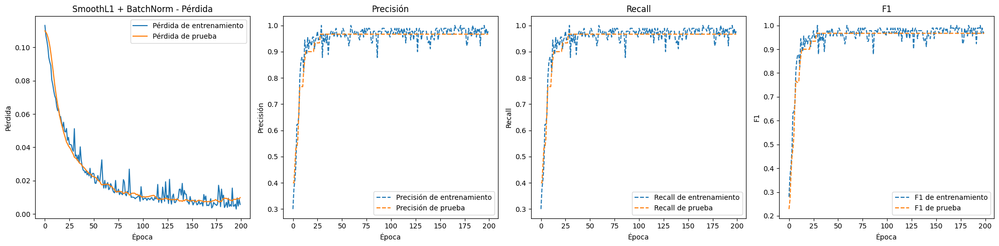

Entrenando modelo con: SmoothL1, regularización: No Regularization, optimizador: Adam
Tiempo de entrenamiento y prueba: 4.64 segundos


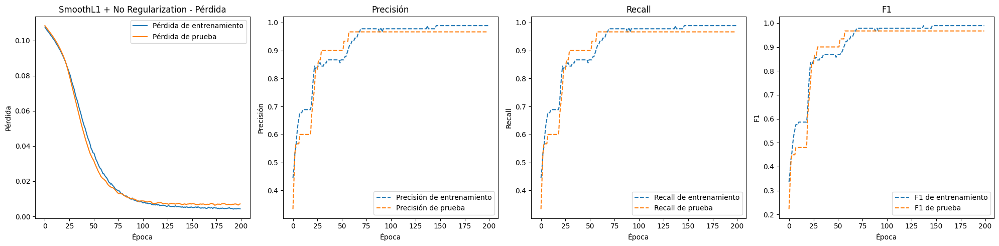

Entrenando modelo con: SoftMargin, regularización: L1, optimizador: Adam
Tiempo de entrenamiento y prueba: 4.67 segundos


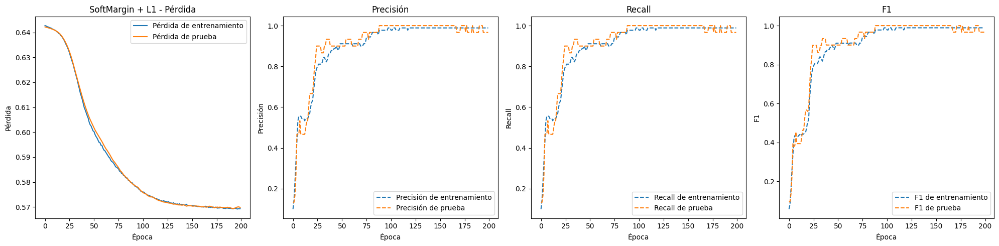

Entrenando modelo con: SoftMargin, regularización: L2, optimizador: Adam
Tiempo de entrenamiento y prueba: 5.15 segundos


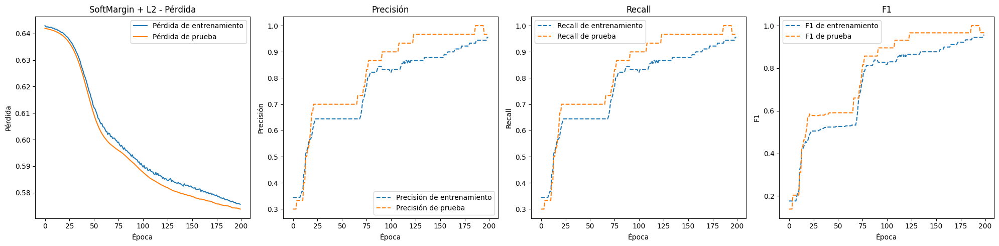

Entrenando modelo con: SoftMargin, regularización: Dropout, optimizador: Adam
Tiempo de entrenamiento y prueba: 4.58 segundos


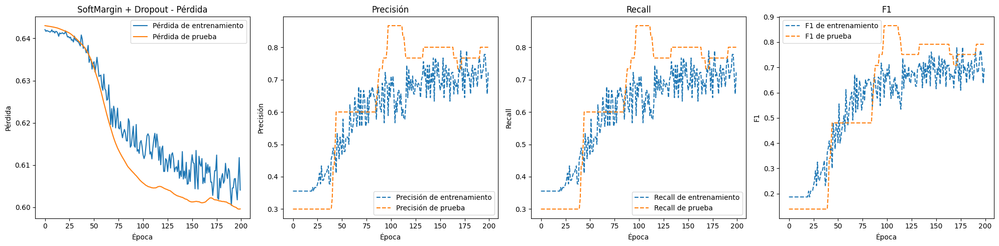

Entrenando modelo con: SoftMargin, regularización: BatchNorm, optimizador: Adam
Tiempo de entrenamiento y prueba: 5.56 segundos


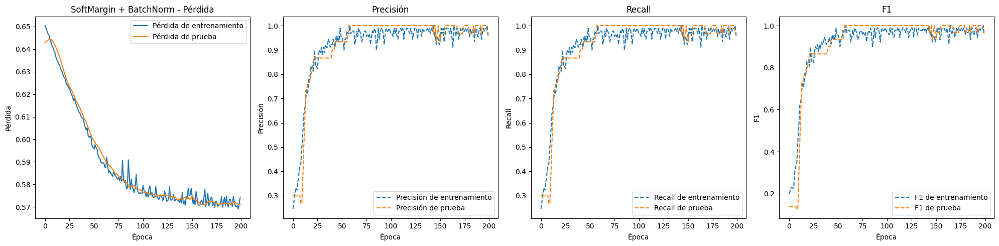

Entrenando modelo con: SoftMargin, regularización: No Regularization, optimizador: Adam
Tiempo de entrenamiento y prueba: 4.74 segundos


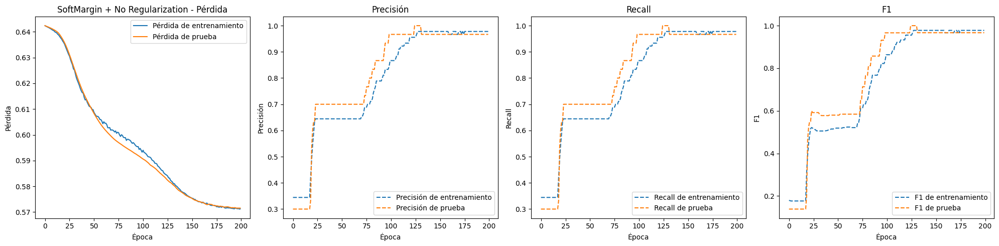

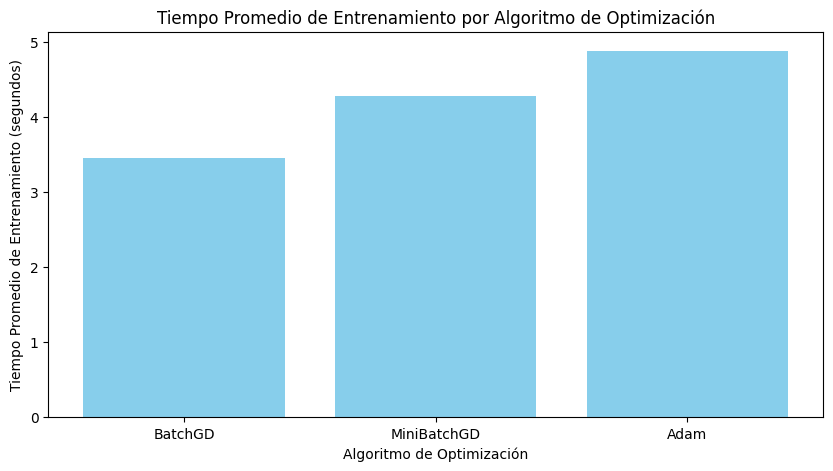

In [21]:
# Lista para almacenar los tiempos de entrenamiento
training_times = []

# Iterar sobre los algoritmos de optimización
for opt_name, opt_class in optimization_algos.items():
    print(f"Optimizador: {opt_name}")
    
    # Entrenar el modelo con diferentes funciones de pérdida y técnicas de regularización
    for i, (loss_name, loss_fn) in enumerate(loss_map.items()):
        for j, reg in enumerate(regularization_options):
            print(f"Entrenando modelo con: {loss_name}, regularización: {reg}, optimizador: {opt_name}")
            network = SFFNN(input_size, hidden_layers, output_size, regularization=reg)
            
            # Configurar el optimizador y el DataLoader
            if opt_name == 'BatchGD':
                optimizer = opt_class(network.parameters(), lr=0.25)
                train_loader = DataLoader(train_loader.dataset, batch_size=len(train_loader.dataset), shuffle=True)  # BatchGD: usar todo el dataset como un batch
            elif opt_name == 'MiniBatchGD':
                optimizer = opt_class(network.parameters(), lr=0.2)
                train_loader = DataLoader(train_loader.dataset, batch_size=32, shuffle=True)  # MiniBatchGD: usar un tamaño de batch pequeño
            else:
                optimizer = opt_class(network.parameters(), lr=0.001)
                train_loader = DataLoader(train_loader.dataset, batch_size=train_loader.batch_size, shuffle=True)
            
            # Medir el tiempo de entrenamiento y prueba
            start_time = time.time()
            train_losses, test_losses, train_accuracies, test_accuracies, train_precisions, test_precisions, train_recalls, test_recalls, train_f1s, test_f1s = train_reg(network, loss_fn, optimizer, train_loader, test_loader, num_epochs=200, verbose=False, regularization=reg)
            end_time = time.time()
            elapsed_time = end_time - start_time
            training_times.append((opt_name, elapsed_time))
            print(f"Tiempo de entrenamiento y prueba: {elapsed_time:.2f} segundos")
            
            # Configuración de subplots
            fig, axes = plt.subplots(1, 4, figsize=(20, 5))
            
            # Graficar las pérdidas
            ax = axes[0]
            ax.plot(train_losses, label='Pérdida de entrenamiento')
            ax.plot(test_losses, label='Pérdida de prueba')
            ax.set_title(f'{loss_name} + {reg} - Pérdida')
            ax.set_xlabel('Época')
            ax.set_ylabel('Pérdida')
            ax.legend()
            
            # Graficar la precisión
            ax = axes[1]
            ax.plot(train_accuracies, label='Precisión de entrenamiento', linestyle='--')
            ax.plot(test_accuracies, label='Precisión de prueba', linestyle='--')
            ax.set_title('Precisión')
            ax.set_xlabel('Época')
            ax.set_ylabel('Precisión')
            ax.legend()
            
            # Graficar el recall
            ax = axes[2]
            ax.plot(train_recalls, label='Recall de entrenamiento', linestyle='--')
            ax.plot(test_recalls, label='Recall de prueba', linestyle='--')
            ax.set_title('Recall')
            ax.set_xlabel('Época')
            ax.set_ylabel('Recall')
            ax.legend()
            
            # Graficar el F1
            ax = axes[3]
            ax.plot(train_f1s, label='F1 de entrenamiento', linestyle='--')
            ax.plot(test_f1s, label='F1 de prueba', linestyle='--')
            ax.set_title('F1')
            ax.set_xlabel('Época')
            ax.set_ylabel('F1')
            ax.legend()
            
            plt.tight_layout()
            plt.show()

# Calcular el tiempo promedio de entrenamiento para cada optimizador
average_times = defaultdict(list)
for opt_name, elapsed_time in training_times:
    average_times[opt_name].append(elapsed_time)

average_times = {opt_name: sum(times) / len(times) for opt_name, times in average_times.items()}

# Graficar el histograma de tiempos de entrenamiento promedio
opt_names, avg_times = zip(*average_times.items())
plt.figure(figsize=(10, 5))
plt.bar(opt_names, avg_times, color='skyblue')
plt.xlabel('Algoritmo de Optimización')
plt.ylabel('Tiempo Promedio de Entrenamiento (segundos)')
plt.title('Tiempo Promedio de Entrenamiento por Algoritmo de Optimización')
plt.show()

# Task 6 - Experimentación y Análisis
Entrene los modelos con diferentes combinaciones de funciones de pérdida, técnicas de regularización y
algoritmos de optimización. Para no complicar esta parte, puede dejar fijo dos de estos parámetros (función de
pérdida, técnicas de regularización, algoritmo de optimización) y solamente cambiar uno de ellos. Deben verse al
menos 9 combinaciones en total, donde es válido que en una de ellas no haya ninguna técnica de regularización. Si
quiere experimentar con más combinaciones se le dará hasta 10% de puntos extra.
Para cada combinación registre métricas como precisión, pérdida y alguna otra métrica que considere pertinente
(Recuerde lo visto en inteligencia artificial).
Visualice las curvas (tanto en precisión, pérdida y la tercera métrica que decidió) de entrenamiento y validación
utilizando bibliotecas como matplotlib y/o seaborn. Además, recuerde llevar tracking de los tiempos de ejecución
de cada combinación.

**Esto ya se hizo en el Task anterior**


# Task 7 - Discusión
Discuta los resultados obtenidos de diferentes modelos. Compare la velocidad de convergencia y el rendimiento
final de modelos utilizando diferentes funciones de pérdida, técnicas de regularización, y algoritmos de
optimización. Explore y discuta por qué ciertas técnicas podrían conducir a un mejor rendimiento. tanto técnicas de
regularización, funciones de pérdida como algoritmos de optimización.

### Respuesta

Yendo de afuera hacia dentro, en primer lugar tenemos los algoritmos de optimización, podemos ver que algoritmos como ADAM llegan más rápido a los mínimos de las funciones, tomando en cuenta que su learning rate puede dejarse más bajo, lo que hace que baje la gradiente de forma más "precisa" con una eficiencia computacional relativa a ello. Por otro lado, tenemos a las funciones "Batch" que usan SGD, en estos casos, se requiere de un learning rate más alto ajustando épocas y demás para que de verdad lleguen a un mínimo, podrían decirse que avanzan "más lento" por el campo. Pero su costo computacional es menor que ADAM por ejemplo.

Yendo un poco más adentro tenemos a las técnicas de regularización, por ejemplo L1 y L2 que son limitaciones o penalizaciones a los valores de descenso y demás que hacen que no se haga overfitting, sin embargo, en determinados puntos estas funciones separan las curvas demasiado y no les permiten acercarse tanto. Por otro lado tenemos a Dropout, que "apaga" neuronas al azar, esto está bien, sin embargo, introduce mucho ruido en las funciones de pérdida, sin embargo este ruido frecuentemente es "cortado" por la línea de pérdida de los tests, lo que en resumen podría decirse que generaliza bien. Por último la normalización por batches, que en nuestro caso fue la que más previno el overfitting junto con directamente no prevenirlo, llegamos a la conclusión que el propósito de estas funciones es "distorsionar" las curvas a modo que salgan de un estado de overfitting, que talvez aleje o "desgeneralice" las curvas si estas están bien ajustadas. 

Por último, con respecto a las funciones de pérdida tenemos varias. De entre ellas las que más problemas causaron fueron las SoftMargin, que necesitan de un learning rate más alto para aproximarse a los gradientes. Y las más consistentes fueron las CrossEntropy y MSE. Las cuales se acercaron a valores más rápido y consistente que las demás, sin embargo hay más parámetros como los algoritmos de optimización que influyen en él.

# Ejercicio 2 - Repaso Teoría

El objetivo de esta parte es repasar los fundamentos teóricos de Transformers y Attention. Para ello lea el paper
“Attention is All You Need”. Luego responda las siguientes preguntas:
1. **¿Cuál es la principal innovación de la arquitectura Transformer?**
   La principal innovación de la arquitectura de transformadores, es el uso de atención, el cual es novedoso. En lugar de las redes neuronales recurrentes o convolucionales típicamente usadas para procesar secuencias de datos. Esto le da la característica a los transformers de manejar datos a largo plazo de manera más eficiente y sobre todo paralelizable. Lo que mejora el rendimiento en tareas de NLP.
2. **¿Cómo funciona el mecanismo de atención del scaled dot-product?**
   El mecanismo funciona de la siguiente forma:
   * **Cálculo de las puntuaciones de atención**: Se calculan las puntuaciones como el producto punto entre las matrices de Queries ($Q$) y Keys ($K$), multiplicadas por la raíz cuadrada de la dimensión del conjunto de claves. $\sqrt{d_k}$. $$\text{Attention}(Q, K, V) = \text{softmax}\left(\frac{QK^T}{\sqrt{d_k}}\right)V$$
   * **Aplicación de la función softmax**: Las puntuaciones se pasan a través de una función softmax para obtener los pesos de atención, que determinan la importancia relativa de cada palabra de la secuencia con respecto a las demás.
   * **Ponderación de los valores**: Los pesos de atención se utilizan para ponderar las matrices de los valores ($V$), dando una combinación ponderada de valores el cual es el output de la atención.
3. **¿Por qué se utiliza la atención de múltiples cabezales en Transformer?**
   Se utilizan para permitir que el modelo enfoque su atención en diferentes partes de la secuencia de entrada al mismo tiempo. Cada cabezal de atención aprende diferentes representaciones y patrones de la secuencia dada, lo que le da más capacidad al modelo de detectar relaciones y dependencias entre los datos. Esto mejora la capacidad del modelo de comprender y generar texto.
4. **¿Cómo se incorporan los positional encodings en el modelo Transformer?**
   Se incoporan para proporcionar información sobre el orden de las palabras. Ya que el modelo en sí no sabe la posición en sí, porque no es recurrente como tal. Estos positional encodings se suman a los embeddings de entrada de las palabras antes de ser procesadas por las atenciones. Los positional encodings se calculan usando funciones sinusoidales a diferentes frecuencias, lo que permite al modelo ver las diferentes posiciones de la secuencia.
5. **¿Cuáles son algunas aplicaciones de la arquitectura Transformer más allá de la machine translation?**
   * **Generación de texto**: GPT es uno de ellos (Generative Pre-trained Transformer).
   * **Visión por computadora**: Vision Transformer (ViT) es uno de ellos, utilizado para clasificar imágenes y detección de objetos.
   * **Clasificación de texto**: Se utilizan también para clasificar los textos, reconociendo sentimientos por ejemplo.
   * **Respuestas a preguntas**: BERT es uno (Bidirectional Encoder Representations from Transformers) se utilizan para responder preguntas basadas en contextos.
   * **Reconocimiento de nombramientos (NER)**: Pueden identificar entidades en los textos, como nombres de personas, organizaciones y lugares.